# Imports and helper variables

In [1]:
import os

import numpy as np
import phoebe
from phoebe import u

import tqdm
import matplotlib.pyplot as plt
import scienceplots
plt.style.use("science")

from astropy.table import Table
from astropy.timeseries import TimeSeries
from astropy.coordinates import EarthLocation, SkyCoord

from lmfit.models import GaussianModel, ConstantModel
from lmfit.model import ModelResult

import utils as gen_utils
from optimizers import opt_utils, dc_optimizer
from sampling import mcmc_utils

import importlib
importlib.reload(gen_utils)
importlib.reload(opt_utils)
importlib.reload(dc_optimizer)
importlib.reload(mcmc_utils)

logger = phoebe.logger(clevel='WARNING')

CLEAN_ITURBIDE_PATH = "/home/ramon/uanl/thesis/Backup Data/Iturbide/cleaned-iturbide.ecsv"

ITURBIDE_LOCATION = EarthLocation(lon=-99.895328*u.deg, lat=24.75521 * u.deg, height=2400*u.m)
ATO_COORD = SkyCoord.from_name("ATO J339.9469+45.1464")

iturbideDataset = 'lcIturbide'

# Load data

In [20]:
iturbideData = Table.read(CLEAN_ITURBIDE_PATH)
iturbideData.remove_column('time')
iturbideData.rename_column('hjd', 'time')
iturbideData

mag,err,filter,time,ltt_corr,obsv_date,norm_flux,norm_ferr
mag,mag,,,,,,mag
float64,float64,str18,Time,TimeDelta,str10,float64,float64
1.2027999999999999,0.0206155281280883,Iturbide:Luminance,2459880.841608384,0.0033265544398984777,2022-10-28,1.2238269144863219,0.023237539716311435
1.3013000000000012,0.03956008088970497,Iturbide:Luminance,2459922.5373161673,0.0012063471745832476,2022-12-09,1.11768648628847,0.04072422713098342
1.2391000000000005,0.0206155281280883,Iturbide:Luminance,2459880.842311,0.003326530177332098,2022-10-28,1.1835864919618604,0.022473470544809505
1.2182999999999993,0.0206155281280883,Iturbide:Luminance,2459924.539855498,0.0010780078240699316,2022-12-11,1.2064796473587158,0.022908156693209343
1.2197999999999993,0.0206155281280883,Iturbide:Luminance,2459880.843009906,0.003326506041772801,2022-10-28,1.2048139849918464,0.02287652975728733
1.1997999999999998,0.01969771560359221,Iturbide:Luminance,2459924.540559342,0.0010779623057632398,2022-12-11,1.2272131493198564,0.02226442803910769
1.251100000000001,0.022472205054244233,Iturbide:Luminance,2459880.8437087024,0.0033264819089261146,2022-10-28,1.170577035963137,0.024228212220124983
1.2329000000000008,0.01969771560359221,Iturbide:Luminance,2459924.5412554373,0.0010779172855032103,2022-12-11,1.19036459177042,0.021595911686949115


In [21]:
ORBITAL_PERIOD = iturbideData.meta['period'] * u.day
ORBITAL_PERIOD

<Quantity 0.33356544 d>

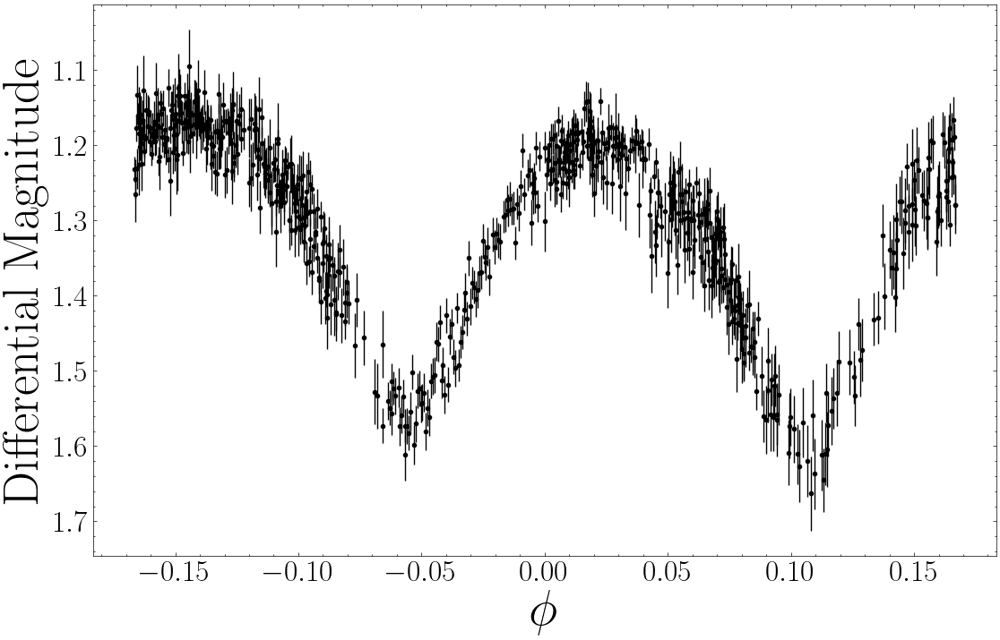

In [23]:
iturbideTs = TimeSeries(iturbideData).fold(ORBITAL_PERIOD)
plt.figure(figsize=(13, 8))
plt.errorbar(iturbideTs.time.value, iturbideTs['mag'], iturbideTs['err'], linestyle='none', marker='.', color='black')
plt.gca().invert_yaxis()
plt.tick_params(axis='both', labelsize=24)
plt.xlabel(r"$\phi$", fontsize=40)
plt.ylabel("Differential Magnitude", fontsize=40)
plt.show()

0.10520018781789998


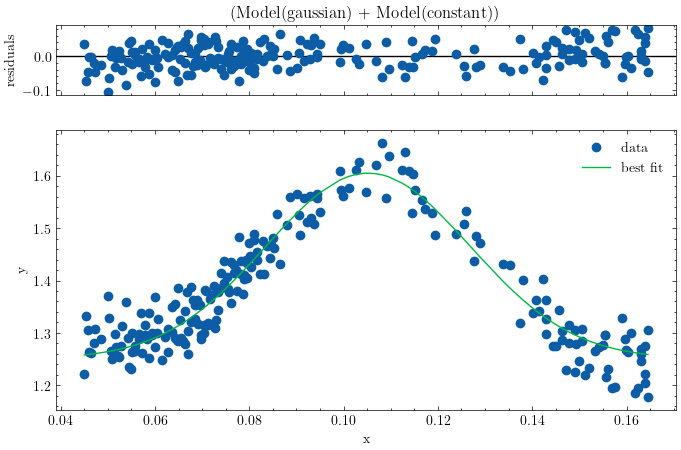

In [5]:
model = GaussianModel() + ConstantModel()

deepEclipsePhaseGuess = 0.105
deepEclipse = iturbideTs[np.isclose(deepEclipsePhaseGuess, iturbideTs.time.value, atol=0.06)].copy()

eclipseFitResult: ModelResult = model.fit(deepEclipse['mag'], x=deepEclipse.time.value)
eclipseFitResult.plot(fig_kws=dict(figsize=(8, 5)))
t0_guess = eclipseFitResult.best_values['center']
print(t0_guess)
eclipseFitResult

# Model setup

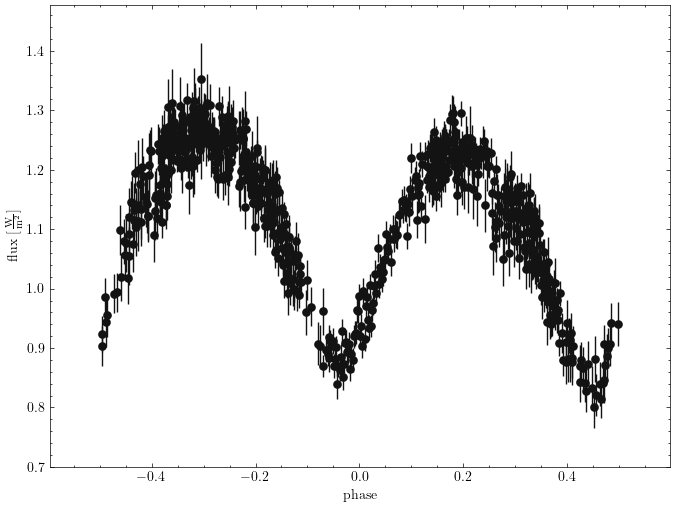

(<autofig.figure.Figure | 1 axes | 1 call(s)>,
 <Figure size 800x600 with 1 Axes>)

In [ ]:
b = phoebe.default_contact_binary()
b.set_value(qualifier='period', component='binary', value=ORBITAL_PERIOD)
b.set_value(qualifier='t0_supconj', value=t0_guess)

# remove constraints for q-search
b.flip_constraint('pot', solve_for='requiv@primary')
b.flip_constraint('fillout_factor', solve_for='pot')

b.flip_constraint('teffratio', solve_for='teff@secondary')

b.add_dataset('mesh', dataset='mesh01', compute_phases=phoebe.linspace(0, 1, 21), columns=['teffs'])
b.add_dataset('lc', dataset=iturbideDataset, compute_phases=phoebe.linspace(0, 1, 201), passband='Johnson:V', pblum_mode='dataset-scaled',
              times=iturbideData['time'].jd, fluxes=iturbideData['norm_flux'], sigmas=iturbideData['norm_ferr'].data)

# fixed primary teff, value taken from teff_msc1 value from GDR3 astrophysical params table
b.set_value(qualifier='teff', component='primary', value=5206.8496*u.K)
b.set_value_all(qualifier='irrad_frac_refl_bol', value=0.5)

b.plot(show=True, x='phase', dataset=iturbideDataset, marker='.', linestyle='none')

# Parameter estimates

## EBAI

In [7]:
b.add_solver('estimator.ebai', ebai_method='knn', phase_bin=False, solver='ebai_estimate', overwrite=True)
b.run_solver(solver='ebai_estimate', solution='ebai_estimate_solution', overwrite=True)
gen_utils.printFittedVals(b, 'ebai_estimate_solution')

Thu, 26 Jun 2025 11:41 PHOEBE       WARNING checks will not be run until 'run_checks' or 'run_compute' is called.
Thu, 26 Jun 2025 11:41 PHOEBE       WARNING constraints will not be run until 'run_delayed_constraints' or 'run_compute' is called.  This may result in inconsistent parameters if printing values before calling either of these methods.
/home/ramon/anaconda3/envs/mapta-tesis/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator KNeighborsRegressor from version 1.0.2 when using version 1.4.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/ramon/anaconda3/envs/mapta-tesis/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.0.2 when using version 1.4.2. This might lead to br

t0_supconj@binary@orbit@component 0.09105 d 
teffratio@binary@orbit@component 0.99643  
incl@binary@orbit@component 71.23528 deg 
fillout_factor@contact_envelope@envelope@component 0.83962  
q@binary@orbit@component 5.22333  


Adopted:
t0_supconj@binary@orbit@component 0.09105 d 
teffratio@binary@orbit@component 0.99643  
incl@binary@orbit@component 71.23528 deg 
fillout_factor@contact_envelope@envelope@component 0.83962  
q@binary@orbit@component 5.22333  

Original values:
  t0_supconj@binary@orbit@component 0.10520 d 
  teffratio@binary@orbit@component 1.00000 
  incl@binary@orbit@component 90.00000 deg 
  fillout_factor@contact_envelope@envelope@component 0.64179 
  q@binary@orbit@component 1.00000 


100%|██████████| 204/204 [00:08<00:00, 25.23it/s]


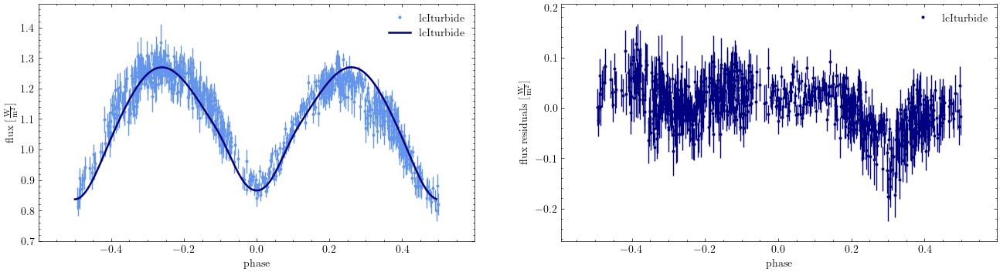

In [8]:
_, computeModelName = opt_utils.adopt_solution(b, solution_name='ebai_estimate_solution')
gen_utils.plotModelResidualsFigsize(b, figsize=(16, 4), model=computeModelName)

# Optimization

## Differential evolution

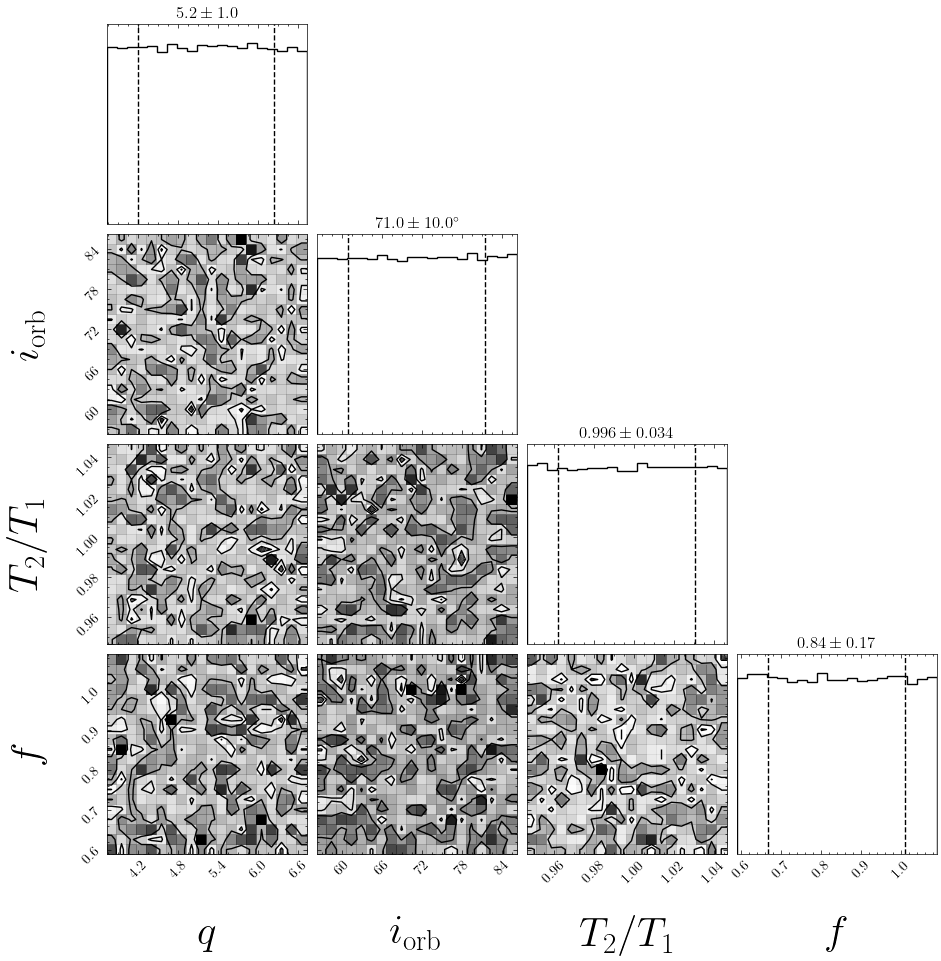

In [9]:
b.add_distribution({
    'q': phoebe.uniform_around(3),
    'incl@binary': phoebe.uniform_around(30),
    'teffratio': phoebe.uniform_around(0.1),
    'fillout_factor': phoebe.uniform_around(0.5)
}, overwrite_all=True, distribution='de_bounds')
mcmc_utils.plotDistribution(b, 'de_bounds')

In [ ]:
opt_utils.optimize_params(b, fit_twigs=['q', 'incl@binary', 'fillout_factor', 'teffratio'], label='de_init', bounds=['de_bounds'], maxiter=250,
                            export=True, datasets=[iturbideDataset], subfolder='iturbide', optimizer='optimizer.differential_evolution')

Thu, 26 Jun 2025 11:41 BUNDLE       WARNING 'progress_every_niters' not a recognized kwarg


External Solver: ./external-jobs/iturbide/optimizer.differential_evolution_opt_de_init.py ./results/opt_de_init_solution


('opt_de_init', 'opt_de_init_solution')

Thu, 26 Jun 2025 11:41 BUNDLE       WARNING not all uniqueids in fitted_uniqueids@opt_de_init_solution@solution are still valid.  Falling back on twigs.  Save and load same bundle to prevent this extra cost.


Adopted:
q@binary@orbit@component 5.08740  
incl@binary@orbit@component 73.71517 deg 
fillout_factor@contact_envelope@envelope@component 0.59321  
teffratio@binary@orbit@component 1.03791  

Original values:
  q@binary@orbit@component 5.22333 
  incl@binary@orbit@component 71.23528 deg 
  fillout_factor@contact_envelope@envelope@component 0.83962 
  teffratio@binary@orbit@component 0.99643 


100%|██████████| 204/204 [00:08<00:00, 24.40it/s]


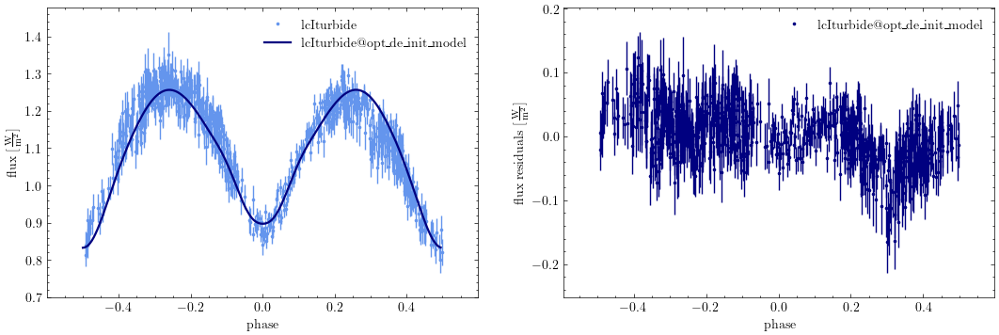

In [11]:
_, computeModelName = opt_utils.adopt_solution(b, solution_file="./external-jobs/iturbide/results/opt_de_init_solution")
gen_utils.plotModelResidualsFigsize(b, figsize=(13, 4), model=computeModelName)

opt_ebai_estimate_model - 1709.5978918765795
	 Iturbide (Norm) - 1709.5978918765795
------------------------------------------------


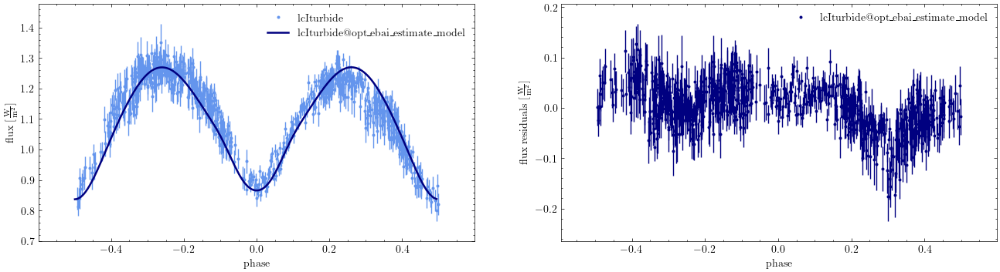

opt_de_init_model - 1428.5634380690008
	 Iturbide (Norm) - 1428.5634380690008
------------------------------------------------


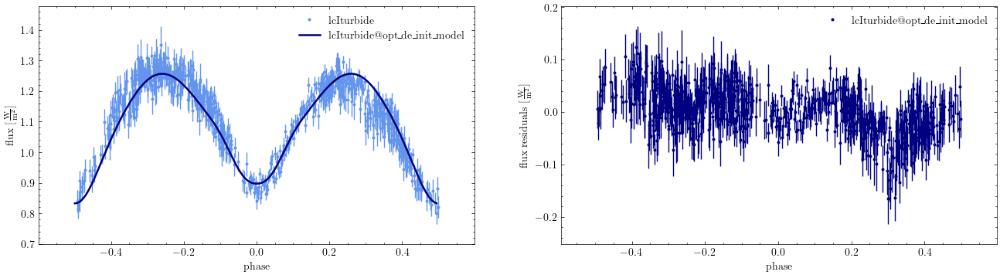

In [12]:
for m in b.models:
    gen_utils.printChi2(b, m)
    gen_utils.plotModelResidualsFigsize(b, figsize=(16, 4), model=m)

## NMS

In [13]:
opt_utils.optimize_params(b, ['q', 'teffratio', 'incl@binary', 'fillout_factor'], label='nm_all', export=True, datasets=[iturbideDataset], subfolder='iturbide')

External Solver: ./external-jobs/iturbide/optimizer.nelder_mead_opt_nm_all.py ./results/opt_nm_all_solution


('opt_nm_all', 'opt_nm_all_solution')

Adopted:
q@binary@orbit@component 4.95973  
teffratio@binary@orbit@component 1.05623  
incl@binary@orbit@component 74.18862 deg 
fillout_factor@contact_envelope@envelope@component 0.59649  

Original values:
  q@binary@orbit@component 5.08740 
  teffratio@binary@orbit@component 1.03791 
  incl@binary@orbit@component 73.71517 deg 
  fillout_factor@contact_envelope@envelope@component 0.59321 


100%|██████████| 204/204 [00:08<00:00, 24.36it/s]


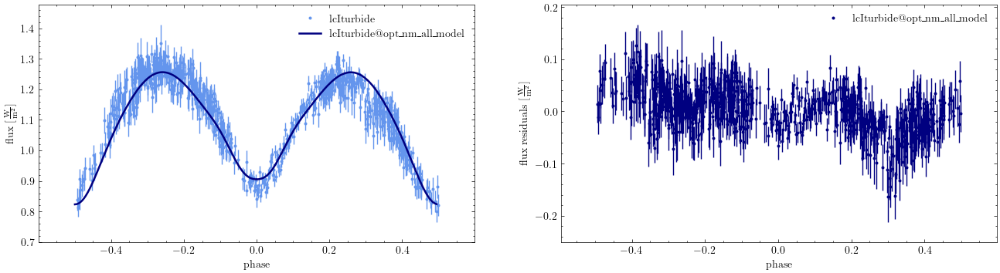

opt_ebai_estimate_model - 1709.5978918765795
	 Iturbide (Norm) - 1709.5978918765795
------------------------------------------------
opt_de_init_model - 1428.5634380690008
	 Iturbide (Norm) - 1428.5634380690008
------------------------------------------------
opt_nm_all_model - 1420.4211800500434
	 Iturbide (Norm) - 1420.4211800500434
------------------------------------------------


In [14]:
_, computeModelName = opt_utils.adopt_solution(b, solution_file="./external-jobs/iturbide/results/opt_nm_all_solution")
gen_utils.plotModelResidualsFigsize(b, figsize=(16, 4), model=computeModelName)
gen_utils.printAllModelsChi2(b)

# Stellar spots

In [15]:
# changing primary teff to teff_msc2 since due to teffratio > 1 (primary is the cooler star)
b.set_value(qualifier='teff', component='primary', value=4806.6836*u.K)
b.run_all_constraints()
print(b['teffratio'])
print(b['teff'])

ParameterSet: 2 parameters
       teffratio@binary@component: 1.0562265488232754
   teffratio@de_bounds@distrib...: <distl.uniform_around width=0.1 value=1.0562265488232754 unit= frac=False>
ParameterSet: 3 parameters
           teff@primary@component: 4806.6836 K
C        teff@secondary@component: 5076.946830113438 K
                  teff@constraint: {teffratio@binary@component} * {teff@primary@component}


In [ ]:
for temp, relteff in zip(['cold', 'hot'], [0.85, 1.15]):
    tempFlip = 1 if temp == 'cold' else -1
    for component in ['primary', 'secondary']:
        componentFlip = -1 if component == 'primary' else 1
        radiusScale = 0.8 if component == 'secondary' else 1

        feature = f"{component}_{temp}_spot"
        b.add_spot(component=component, feature=feature, overwrite=True,
                relteff=relteff, radius=20*radiusScale, colat=90, long=90*tempFlip*componentFlip)
        
        gen_utils.abilitateFeatures(b, feature)

        # print(feature)
        # model = "init_spot_model"
        # b.run_compute(model=model, overwrite=True)
        # gen_utils.plotModelResidualsFigsize(b, figsize=(13, 3), model=model)
        # phase = 0.25 if temp == 'cold' else 0.75
        # b.plot(show=True, kind='mesh', phase=phase, fc='teffs', ec='face', model=model, draw_sidebars=True, title=fr"$\phi = {phase}$", draw_title=True)
        
        opt_utils.optimize_params(b, label=feature, export=True, datasets=[iturbideDataset], subfolder='iturbide/spots',
                                fit_twigs=[f'long@{feature}', f'radius@{feature}', f'relteff@{feature}'])

External Solver: ./external-jobs/iturbide/spots/optimizer.nelder_mead_opt_primary_cold_spot.py ./results/opt_primary_cold_spot_solution
External Solver: ./external-jobs/iturbide/spots/optimizer.nelder_mead_opt_secondary_cold_spot.py ./results/opt_secondary_cold_spot_solution
External Solver: ./external-jobs/iturbide/spots/optimizer.nelder_mead_opt_primary_hot_spot.py ./results/opt_primary_hot_spot_solution
External Solver: ./external-jobs/iturbide/spots/optimizer.nelder_mead_opt_secondary_hot_spot.py ./results/opt_secondary_hot_spot_solution


In [18]:
spotSolutionsDir = "./external-jobs/iturbide/spots/results/"
for f in os.listdir(spotSolutionsDir):
    if '.progress' in f:
        continue
    
    spotFeature = f.replace('opt_', '').replace('_solution', '')
    gen_utils.abilitateFeatures(b, spotFeature)
    opt_utils.adopt_solution(b, solution_file=os.path.join(spotSolutionsDir, f), print_sol=False)

100%|██████████| 204/204 [00:09<00:00, 22.54it/s]


In [19]:
minChi2 = np.inf
bestFeature: str
for m in [mod for mod in b.models if 'opt' in mod and 'spot_model' in mod]:
    modelChi2 = b.calculate_chi2(model=m, dataset=iturbideDataset)
    if modelChi2 < minChi2:
        minChi2 = modelChi2
        bestFeature = m.replace("opt_", "").replace("_model", "")
minChi2, bestFeature

(1184.7142876196776, 'secondary_cold_spot')

Adopted:
long@secondary_cold_spot@secondary@spot@feature 59.27898 deg 
radius@secondary_cold_spot@secondary@spot@feature 17.85679 deg 
relteff@secondary_cold_spot@secondary@spot@feature 0.93042  

Original values:
  long@secondary_cold_spot@secondary@spot@feature 59.27898 deg 
  radius@secondary_cold_spot@secondary@spot@feature 17.85679 deg 
  relteff@secondary_cold_spot@secondary@spot@feature 0.93042 


100%|██████████| 204/204 [00:08<00:00, 23.94it/s]


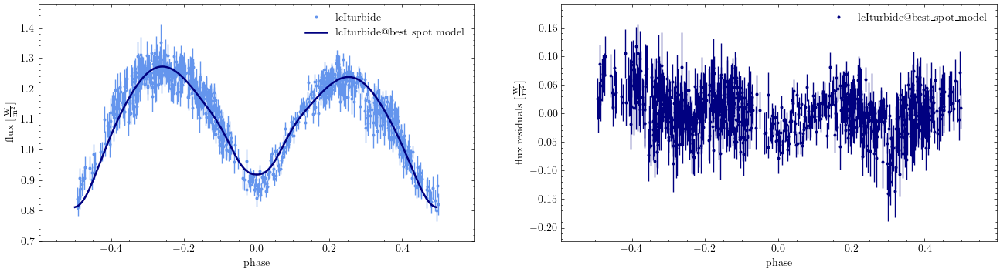

In [20]:
gen_utils.abilitateFeatures(b, bestFeature)
_, computeModelName = opt_utils.adopt_solution(b, solution_name=f"opt_{bestFeature}_solution", compute_model_name="best_spot_model")
gen_utils.plotModelResidualsFigsize(b, figsize=(16, 4), model=computeModelName)

# Final optimization

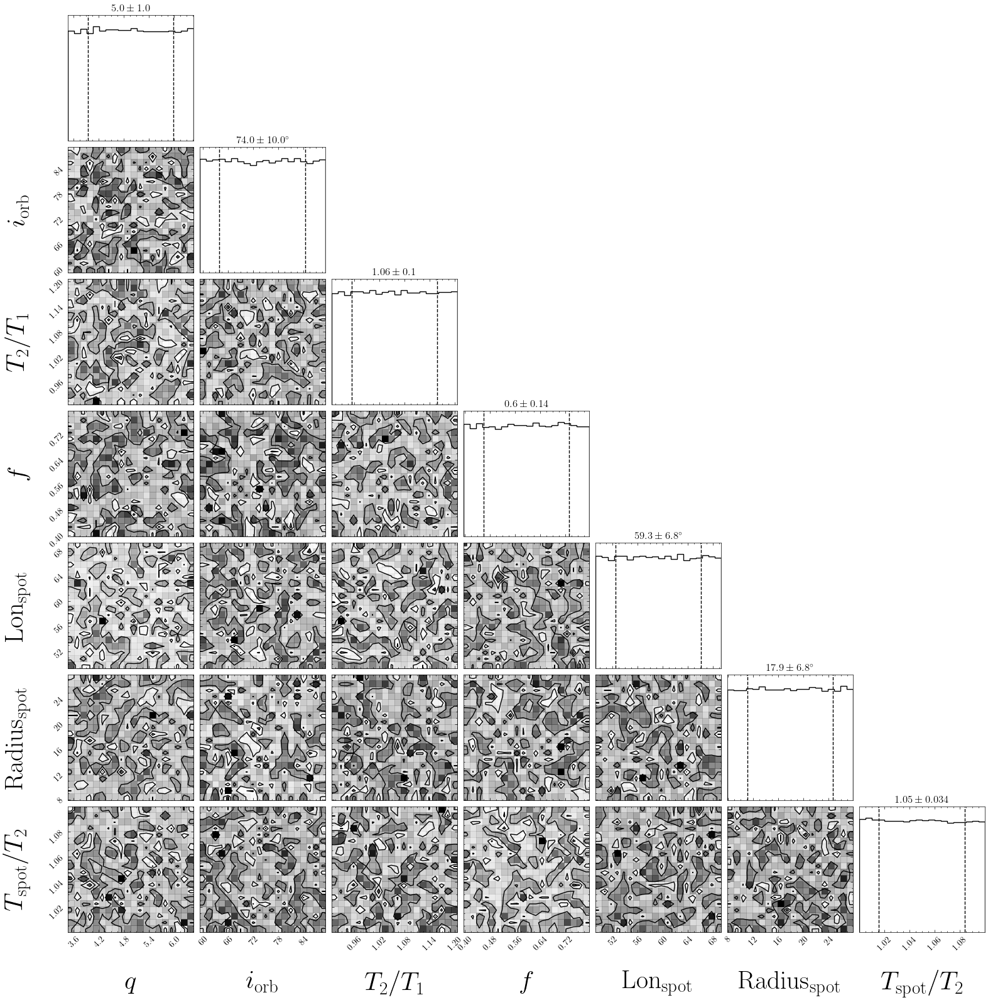

In [21]:
b.add_distribution({
    'q': phoebe.uniform_around(3),
    'incl@binary': phoebe.uniform_around(30),
    'teffratio': phoebe.uniform_around(0.3),
    'fillout_factor': phoebe.uniform_around(0.4),

    f'long@{bestFeature}': phoebe.uniform_around(20),
    f'radius@{bestFeature}': phoebe.uniform_around(20),
    f'relteff@{bestFeature}': phoebe.uniform(1, 1.1)
}, overwrite_all=True, distribution='spotted_de_bounds')
mcmc_utils.plotDistribution(b, 'spotted_de_bounds')

In [22]:
opt_utils.optimize_params(b, fit_twigs=['q', 'incl@binary', 'fillout_factor', 'teffratio', f'long@{bestFeature}', f'radius@{bestFeature}', f'relteff@{bestFeature}'],
                            label='spotted_de', export=True, datasets=[iturbideDataset], subfolder='iturbide', optimizer='optimizer.differential_evolution', maxiter=250, bounds=['spotted_de_bounds'])

External Solver: ./external-jobs/iturbide/optimizer.differential_evolution_opt_spotted_de.py ./results/opt_spotted_de_solution


('opt_spotted_de', 'opt_spotted_de_solution')

Adopted:
q@binary@orbit@component 3.99660  
incl@binary@orbit@component 72.05822 deg 
fillout_factor@contact_envelope@envelope@component 0.45442  
teffratio@binary@orbit@component 1.05168  
long@secondary_cold_spot@secondary@spot@feature 62.37989 deg 
radius@secondary_cold_spot@secondary@spot@feature 9.79425 deg 
relteff@secondary_cold_spot@secondary@spot@feature 1.00089  

Original values:
  q@binary@orbit@component 4.95973 
  incl@binary@orbit@component 74.18862 deg 
  fillout_factor@contact_envelope@envelope@component 0.59649 
  teffratio@binary@orbit@component 1.05623 
  long@secondary_cold_spot@secondary@spot@feature 59.27898 deg 
  radius@secondary_cold_spot@secondary@spot@feature 17.85679 deg 
  relteff@secondary_cold_spot@secondary@spot@feature 0.93042 


Thu, 26 Jun 2025 15:26 BUNDLE       ERROR   Constraint 'requiv@secondary@star@constraint' raised the following error while attempting to solve for 'requiv@secondary@star@component'.  Consider flipping the constraint or changing the value of one of ['pot@contact_envelope@envelope@component', 'q@binary@orbit@component', 'sma@binary@orbit@component', 'requiv@secondary@star@component'] until the constraint succeeds.  Original error: potential > L1 critical value
Thu, 26 Jun 2025 15:26 BUNDLE       ERROR   Constraint 'requiv@primary@star@constraint' raised the following error while attempting to solve for 'requiv@primary@star@component'.  Consider flipping the constraint or changing the value of one of ['requiv@primary@star@component', 'q@binary@orbit@component', 'sma@binary@orbit@component', 'pot@contact_envelope@envelope@component'] until the constraint succeeds.  Original error: potential > L1 critical value
100%|██████████| 204/204 [00:08<00:00, 22.84it/s]
Thu, 26 Jun 2025 15:26 BUNDLE 

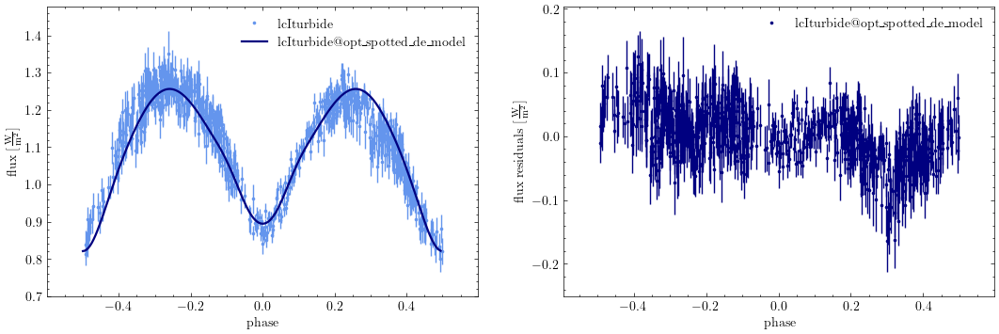

opt_ebai_estimate_model - 1709.5978918765795
	 Iturbide (Norm) - 1709.5978918765795
------------------------------------------------
opt_de_init_model - 1428.5634380690008
	 Iturbide (Norm) - 1428.5634380690008
------------------------------------------------
opt_nm_all_model - 1420.4211800500434
	 Iturbide (Norm) - 1420.4211800500434
------------------------------------------------
init_spot_model - 1916.9046483736486
	 Iturbide (Norm) - 1916.9046483736486
------------------------------------------------
opt_primary_hot_spot_model - 1280.7538113631865
	 Iturbide (Norm) - 1280.7538113631865
------------------------------------------------
opt_primary_cold_spot_model - 1189.9549519077063
	 Iturbide (Norm) - 1189.9549519077063
------------------------------------------------
opt_secondary_cold_spot_model - 1184.7142876196776
	 Iturbide (Norm) - 1184.7142876196776
------------------------------------------------
opt_secondary_hot_spot_model - 1282.7810359583832
	 Iturbide (Norm) - 1282.78

In [23]:
_, computeModelName = opt_utils.adopt_solution(b, solution_file="./external-jobs/iturbide/results/opt_spotted_de_solution", reset_params=True)
gen_utils.plotModelResidualsFigsize(b, figsize=(13, 4), model=computeModelName)
gen_utils.printAllModelsChi2(b)

# Passband luminosity scaling

In [25]:
b.set_value(qualifier='pblum_mode', value='component-coupled')
print(b['pblum'])

Parameter: pblum@primary@lcIturbide@dataset
                       Qualifier: pblum
                     Description: Passband luminosity (defined at t0)
                           Value: 12.566370614359172 W
                  Constrained by: 
                      Constrains: None
                      Related to: None
                 Only visible if: [component]pblum_mode:decoupled||[component]pblum_mode:component-coupled,[component]pblum_component:<component>



100%|██████████| 204/204 [00:08<00:00, 24.36it/s]


default_pblum_model - 25493611.47113171
	 Iturbide (Norm) - 25493611.47113171
------------------------------------------------


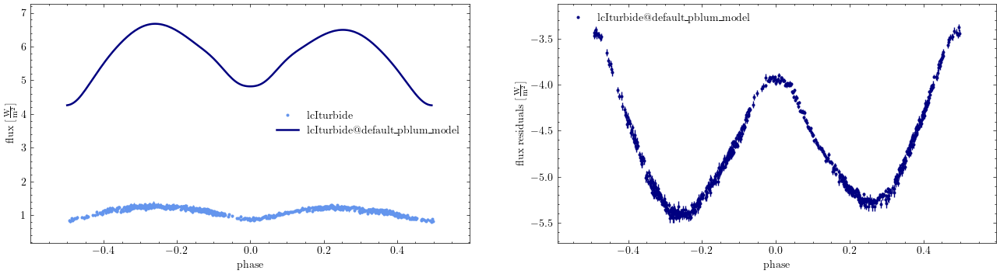

In [26]:
b.run_compute(model='default_pblum_model')
gen_utils.printChi2(b, 'default_pblum_model')
gen_utils.plotModelResidualsFigsize(b, figsize=(16, 4), model='default_pblum_model')

100%|██████████| 204/204 [00:08<00:00, 24.54it/s]


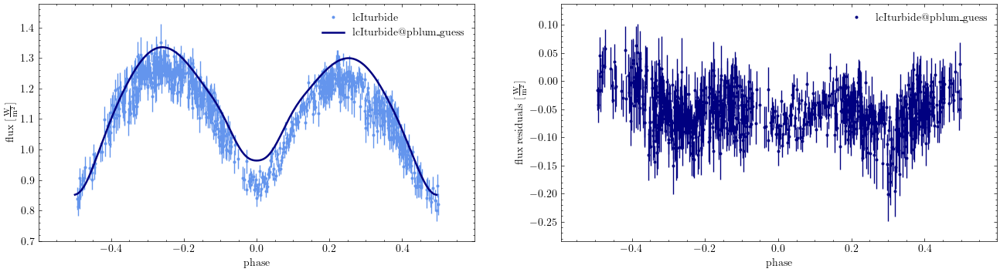

In [27]:
b.set_value(qualifier='pblum', value=0.8*np.pi*u.W) # original is ~4*pi
b.run_compute(model='pblum_guess', overwrite=True)
gen_utils.plotModelResidualsFigsize(b, figsize=(16, 4), model='pblum_guess')

In [28]:
opt_utils.optimize_params(b, [f'pblum@primary@{iturbideDataset}'], label='pblum', export=True, datasets=[iturbideDataset], subfolder='iturbide')

External Solver: ./external-jobs/iturbide/optimizer.nelder_mead_opt_pblum.py ./results/opt_pblum_solution


('opt_pblum', 'opt_pblum_solution')

Adopted:
pblum@primary@lcIturbide@lc@dataset 2.39368 W 

Original values:
  pblum@primary@lcIturbide@lc@dataset 2.51327 W 


100%|██████████| 204/204 [00:09<00:00, 22.48it/s]


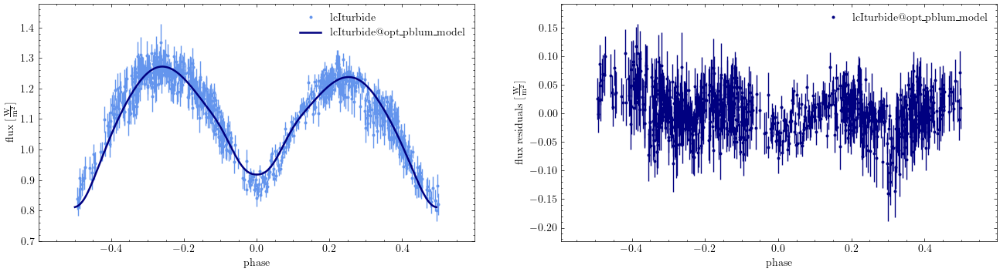

opt_ebai_estimate_model - 1709.5978918765795
	 Iturbide (Norm) - 1709.5978918765795
------------------------------------------------
opt_de_init_model - 1428.5634380690008
	 Iturbide (Norm) - 1428.5634380690008
------------------------------------------------
opt_nm_all_model - 1420.4211800500434
	 Iturbide (Norm) - 1420.4211800500434
------------------------------------------------
init_spot_model - 1916.9046483736486
	 Iturbide (Norm) - 1916.9046483736486
------------------------------------------------
opt_primary_hot_spot_model - 1280.7538113631865
	 Iturbide (Norm) - 1280.7538113631865
------------------------------------------------
opt_primary_cold_spot_model - 1189.9549519077063
	 Iturbide (Norm) - 1189.9549519077063
------------------------------------------------
opt_secondary_cold_spot_model - 1184.7142876196776
	 Iturbide (Norm) - 1184.7142876196776
------------------------------------------------
opt_secondary_hot_spot_model - 1282.7810359583832
	 Iturbide (Norm) - 1282.78

In [29]:
_, computeModelName = opt_utils.adopt_solution(b, solution_file='./external-jobs/iturbide/results/opt_pblum_solution')
gen_utils.plotModelResidualsFigsize(b, figsize=(16, 4), model=computeModelName)
gen_utils.printAllModelsChi2(b)

# MCMC

## Setting up sampler

In [30]:
for f in b.features:
    if not b.get_value(qualifier='enabled', feature=f):
        b.remove_feature(f)

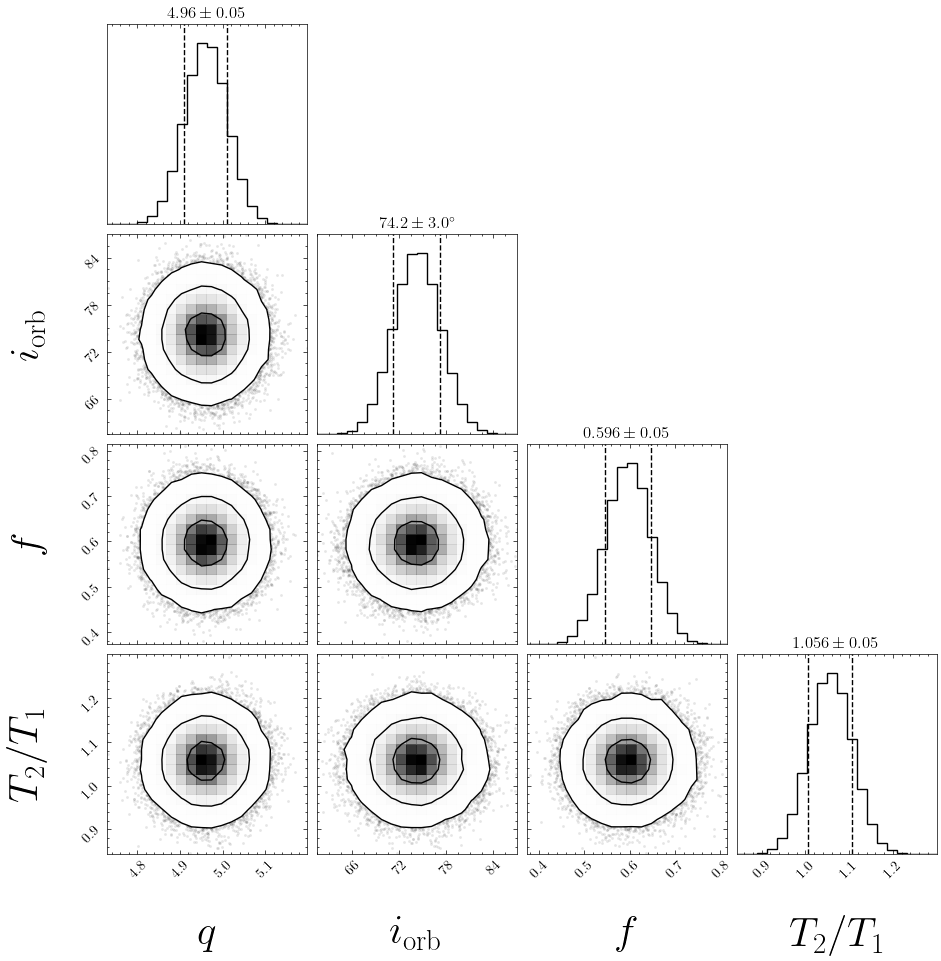

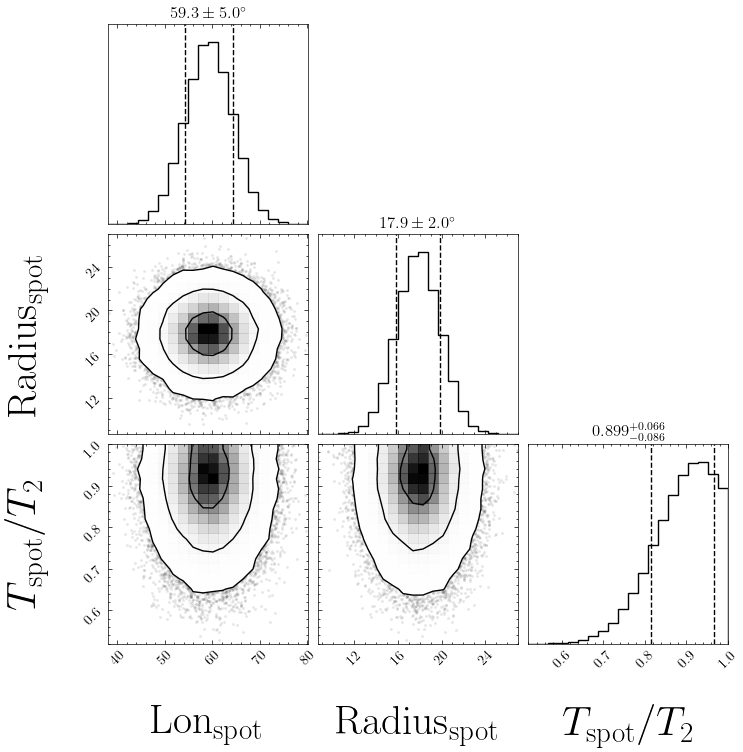

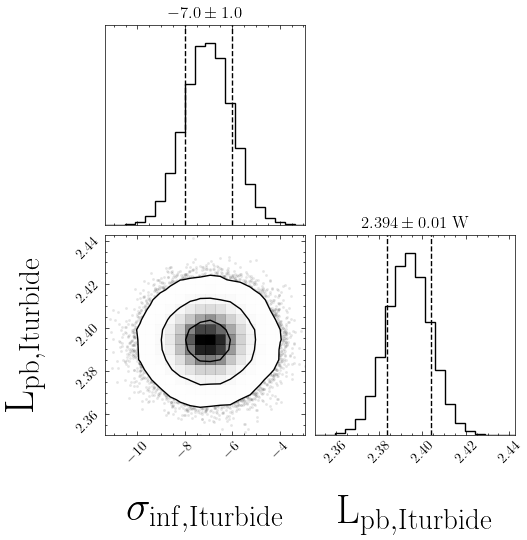

In [31]:
b.add_distribution({
    'q': phoebe.gaussian_around(0.05),
    'incl@binary': phoebe.gaussian_around(3),
    'fillout_factor': phoebe.gaussian_around(0.05),
    'teffratio': phoebe.gaussian_around(0.05)
}, distribution='mcmc_init', overwrite_all=True)

b.add_distribution({
    'long@secondary_cold_spot': phoebe.gaussian_around(5),
    'radius@secondary_cold_spot': phoebe.gaussian_around(2),
    'relteff@secondary_cold_spot': phoebe.gaussian_around(0.1, value=b.get_value(qualifier='relteff', feature='secondary_cold_spot', context='feature')) & phoebe.uniform(low=0.5, high=1),
}, distribution='spot_init', overwrite_all=True)

b.add_distribution({
    # values tend to range from -20 to 1 <= from PHOEBE workshop Notebook (parameter-marginalization.ipynb)
		# from Angela's experience
		# should converge to an appropriate value eventually
	f'sigmas_lnf@{iturbideDataset}': phoebe.gaussian(-7, 1),
    f'pblum@primary@{iturbideDataset}': phoebe.gaussian_around(0.01),
}, distribution='mcmc_nuisance_init', overwrite_all=True)

mcmc_utils.plotDistribution(b, 'mcmc_init')
mcmc_utils.plotDistribution(b, 'spot_init')
mcmc_utils.plotDistribution(b, 'mcmc_nuisance_init')

In [32]:
# sticking with 3000 for now since fillout factor isn't close to 0

print(b['fillout_factor@component'])
print(b['ntriangles'])

Parameter: fillout_factor@contact_envelope@component
                       Qualifier: fillout_factor
                     Description: Fillout-factor of the envelope
                           Value: 0.5964918476562588
                  Constrained by: 
                      Constrains: pot@contact_envelope@component
                      Related to: q@binary@component, pot@contact_envelope@component

Parameter: ntriangles@contact_envelope@phoebe01@compute
                       Qualifier: ntriangles
                     Description: Requested number of triangles (won't be exact).
                           Value: 3000
                  Constrained by: 
                      Constrains: None
                      Related to: None
                 Only visible if: mesh_method:marching,hierarchy.is_meshable:true



In [38]:
b.remove_models_all()
mcmc_utils.exportSampler(b, sampler_solver='mcmc', subfolder='iturbide', datasets=[iturbideDataset], 
			  	init_from=['mcmc_init', 'spot_init', 'mcmc_nuisance_init'], nwalkers=150, niters=100000, progress_every_niters=5)

mcmc | external-jobs/iturbide/mcmc.py | results/mcmc


In [36]:
gen_utils.saveBundle(b, 'solved-mcmc', subfolder='iturbide')

Thu, 26 Jun 2025 15:39 PARAMETERS   WARNING for faster compact saving, install ujson


'bundle-saves/iturbide/solved-mcmc.json.gz'

## Results

In [2]:
b = gen_utils.loadBundle('solved-mcmc', subfolder='iturbide')

b.run_compute(model='before_mcmc_model')

100%|██████████| 204/204 [00:09<00:00, 22.10it/s]


<ParameterSet: 215 parameters | kinds: lc, mesh>

Parameter autocorrelation times 
	   Total iterations: 7233 (1063 burnin) 
	   Avg. autocorr time: 400.88773251425556 
	   Avg. IIDs: 15.390842621457853
---------------------------------------------------------------
q@binary@orbit@component
	Autocorrelation time: 444.15046796780763
	IIDs ([iters - burnin]/autocorr_time): 13.891688616766709
incl@binary@orbit@component
	Autocorrelation time: 417.6790563877459
	IIDs ([iters - burnin]/autocorr_time): 14.772107688043079
fillout_factor@contact_envelope@envelope@component
	Autocorrelation time: 342.6702977654414
	IIDs ([iters - burnin]/autocorr_time): 18.0056457773979
teffratio@binary@orbit@component
	Autocorrelation time: 407.9751280798752
	IIDs ([iters - burnin]/autocorr_time): 15.123470955298062
long@secondary_cold_spot@secondary@spot@feature
	Autocorrelation time: 318.2232283575413
	IIDs ([iters - burnin]/autocorr_time): 19.388905177807025
radius@secondary_cold_spot@secondary@spot@feature
	Autocorrelation time: 438.6849666799852
	IIDs ([

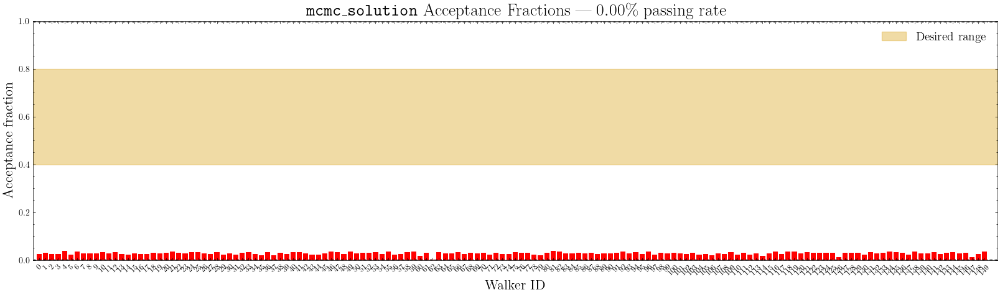

Tue, 15 Jul 2025 16:45 root         WARNING Too few points to create valid contours
Tue, 15 Jul 2025 16:45 root         WARNING Too few points to create valid contours
Tue, 15 Jul 2025 16:45 root         WARNING Too few points to create valid contours
Tue, 15 Jul 2025 16:45 root         WARNING Too few points to create valid contours
Tue, 15 Jul 2025 16:45 root         WARNING Too few points to create valid contours


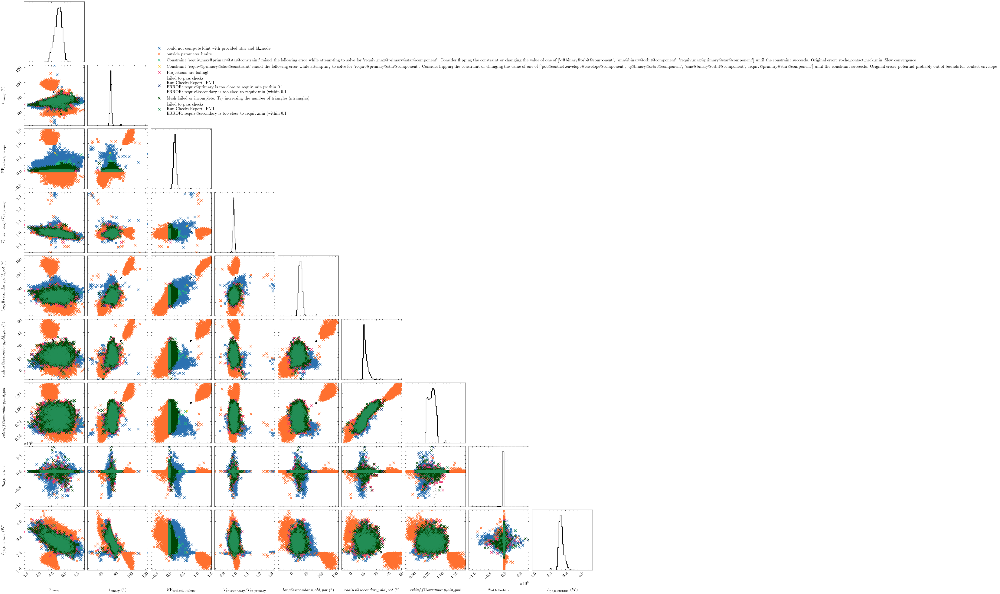

In [3]:
b.import_solution(fname="./external-jobs/iturbide/results/mcmc.progress", overwrite=True)

mcmc_utils.printParameterAutocorrTimes(b, 'mcmc_solution')
mcmc_utils.plotSamplerAcceptanceFractions(b, 'mcmc_solution', vertical=False, figsize=(20, 5))
_ = b.plot(solution='mcmc_solution', style='failed', show=True)

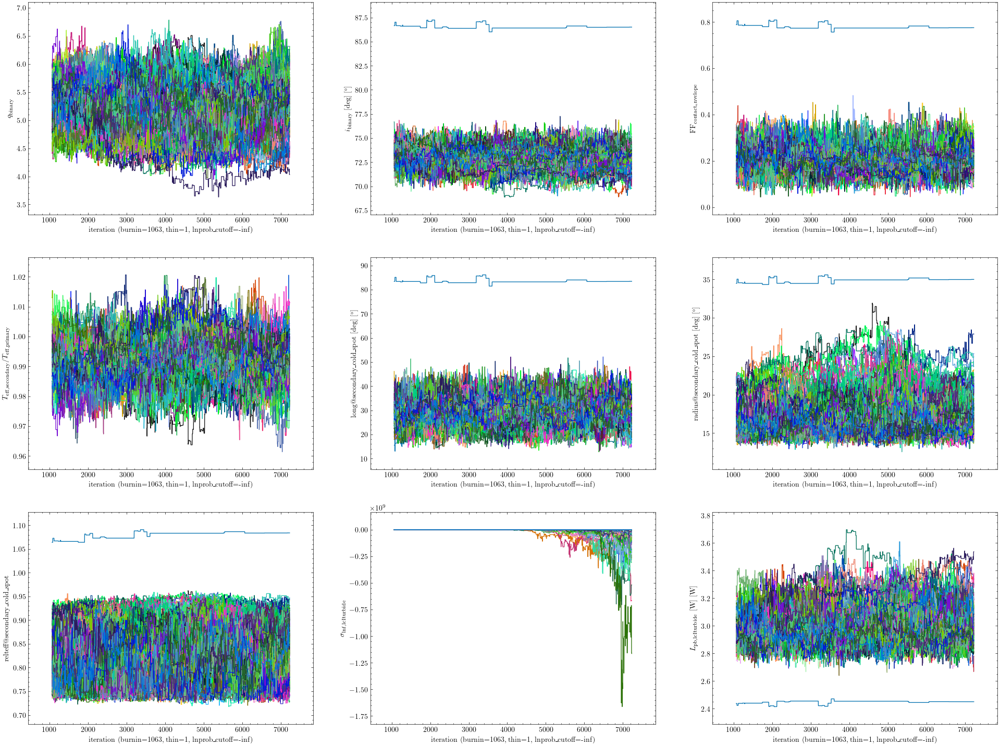

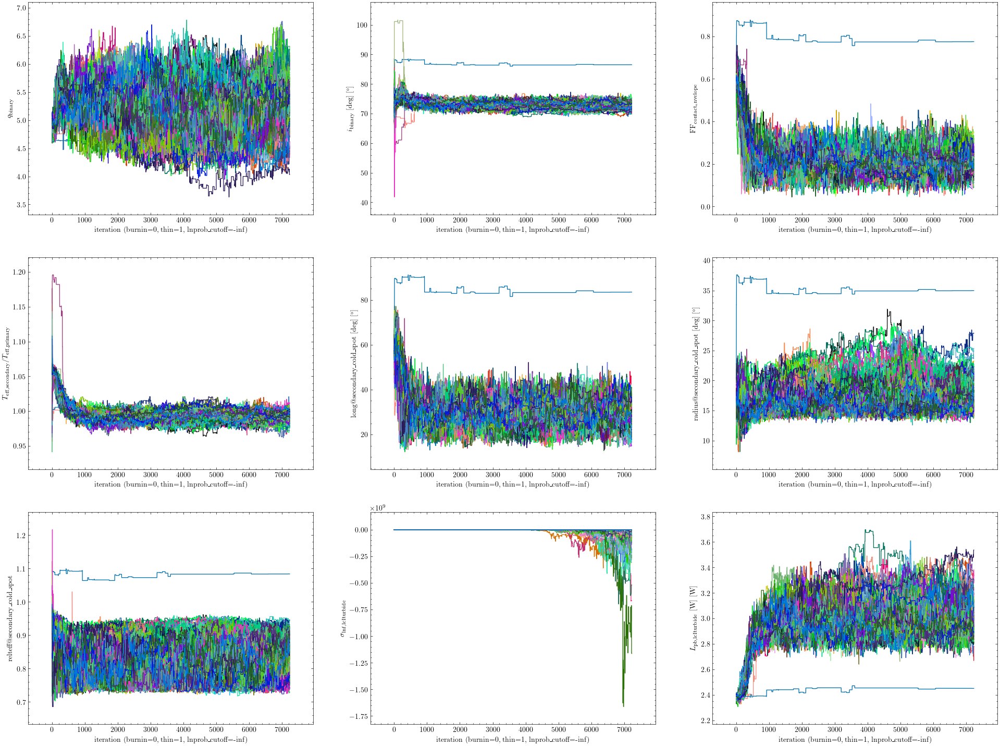

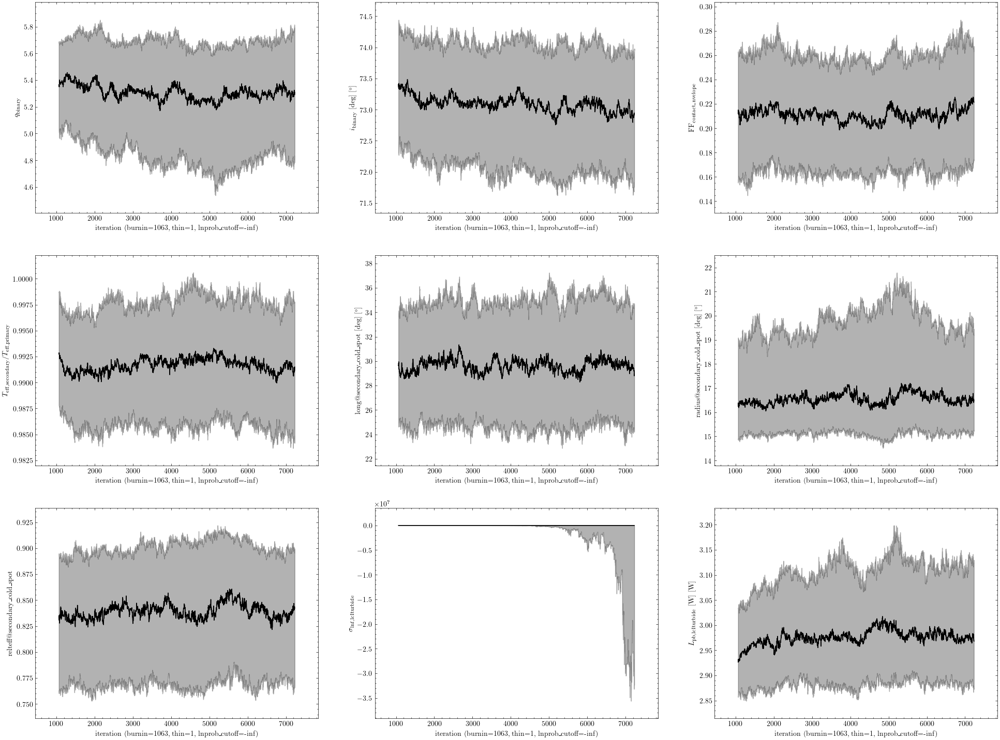

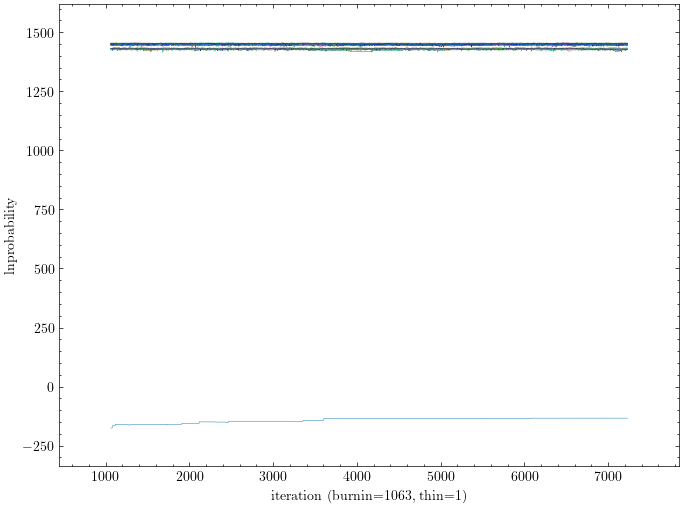

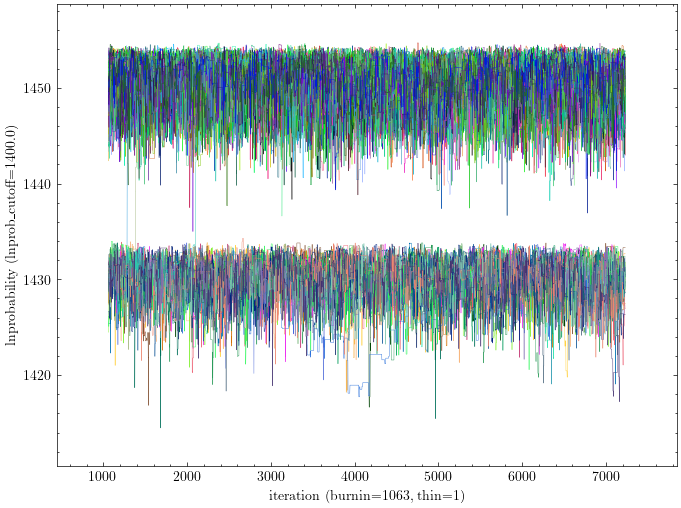

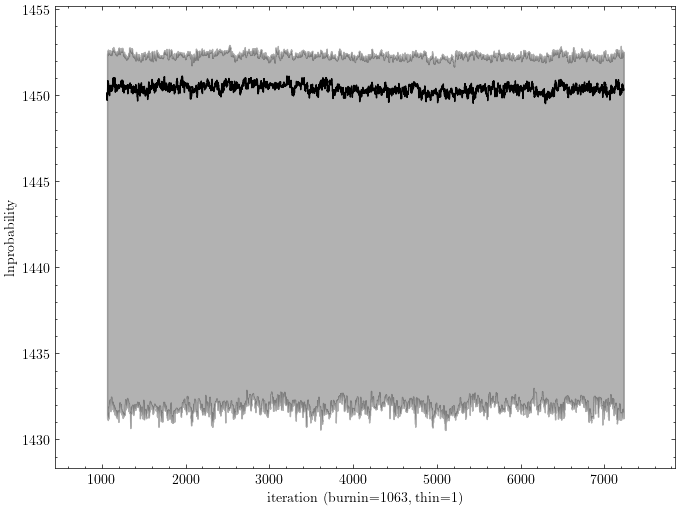

(<autofig.figure.Figure | 1 axes | 2 call(s)>,
 <Figure size 800x600 with 1 Axes>)

In [4]:
b.plot(solution='mcmc_solution', show=True, style='trace', s=0.002)
b.plot(solution='mcmc_solution', show=True, style='trace', s=0.002, burnin=0)
b.plot(solution='mcmc_solution', show=True, style='trace_spread', s=0.002) 
b.plot(solution='mcmc_solution', show=True, style='lnprobability', s=0.002)
b.plot(solution='mcmc_solution', show=True, style='lnprobability', s=0.002, lnprob_cutoff=1400)
b.plot(solution='mcmc_solution', show=True, style='lnprobabilities_spread', s=0.002)

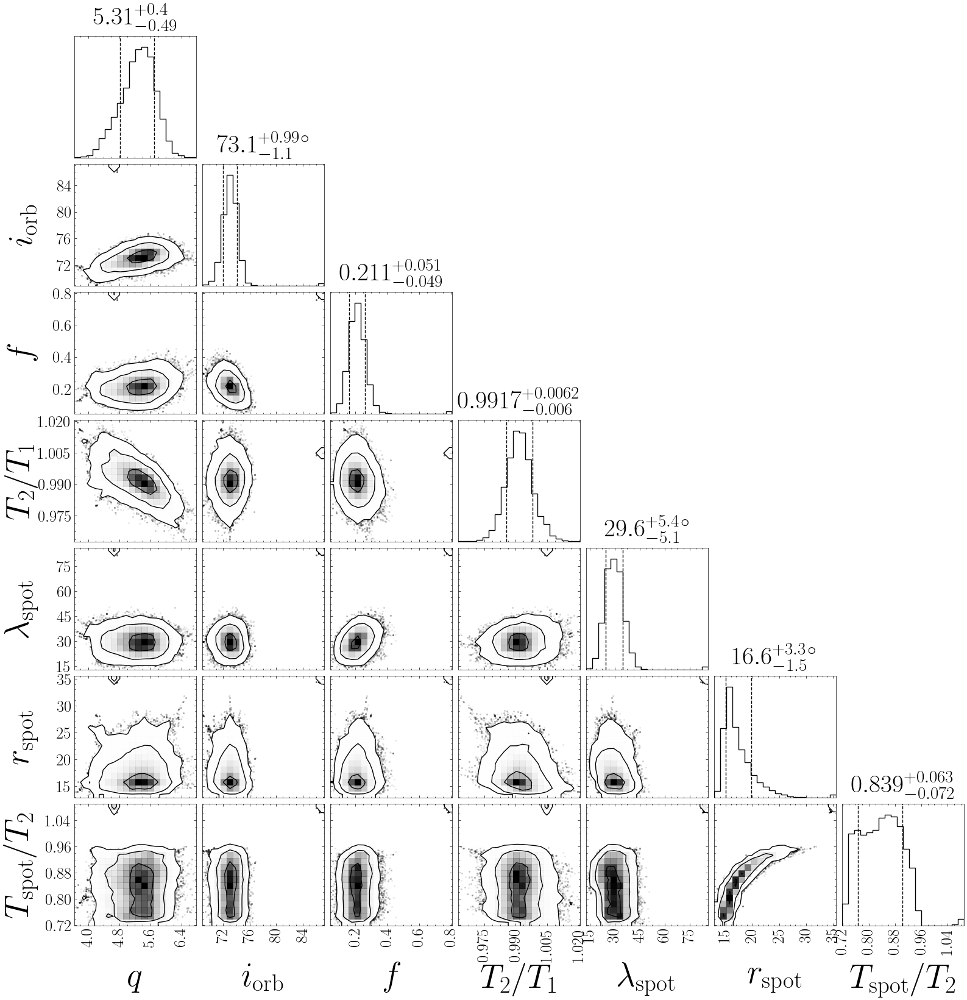

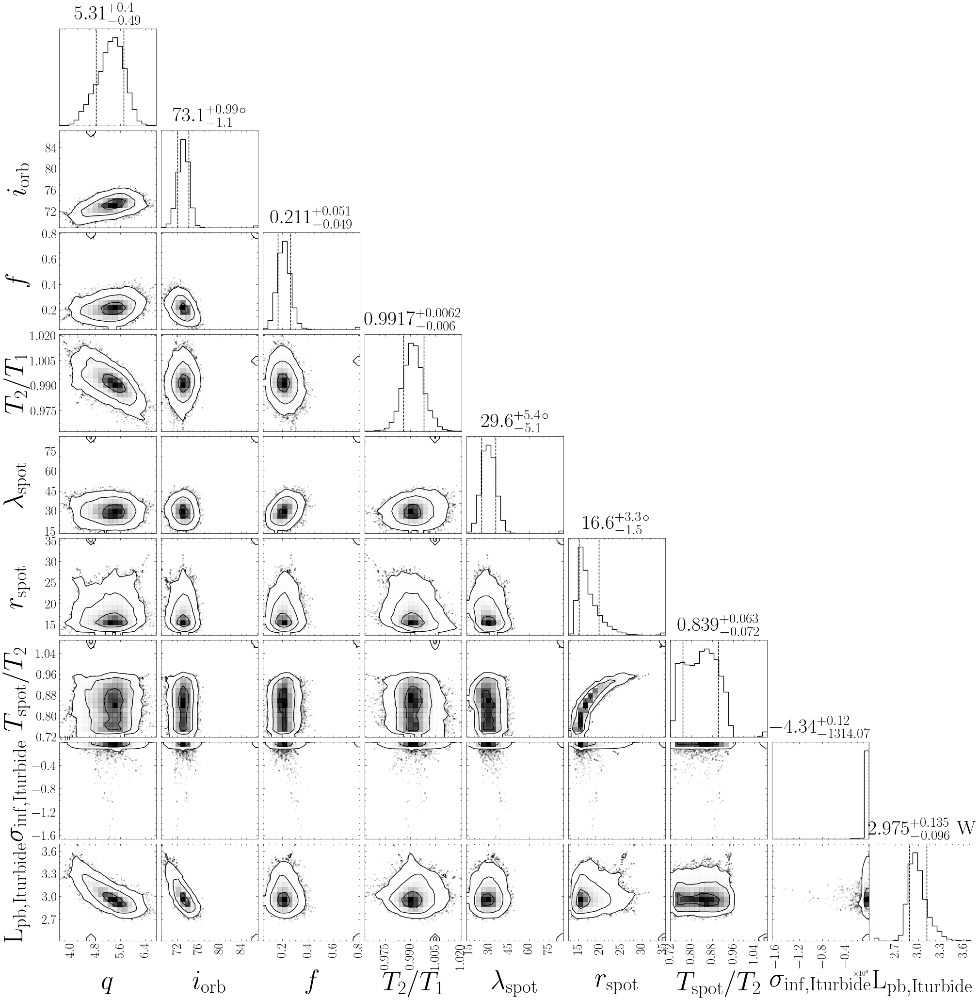

In [5]:
# used for distribution uncertainty font size
plt.rcParams['axes.titlesize'] = 30
plt.rcParams['axes.titlepad'] = 14

spot = b.features[0]
component = b[spot].component
physicalParams = ['q@binary@orbit@component', 'incl@binary@orbit@component', 'fillout_factor@contact_envelope@envelope@component', 'teffratio@binary@orbit@component', 
                  f'long@{spot}@{component}@spot@feature', f'radius@{spot}@{component}@spot@feature', f'relteff@{spot}@{component}@spot@feature']

mcmc_utils.plotDistribution(b, distribution='mcmc_solution', parameters=physicalParams, markersize=30)
mcmc_utils.plotDistribution(b, distribution='mcmc_solution')

### Distribution model

In [6]:
lnprob_cutoff = 1440
# lnprob_cutoff = None

uncertainties = b.uncertainties_from_distribution_collection('mcmc_solution', lnprob_cutoff=lnprob_cutoff)

for l, svals, unit in zip([mcmc_utils.LATEX_LABELS[t] for t in b.get_value(qualifier='fitted_twigs', solution='mcmc_solution')], 
                          uncertainties, 
                          b.get_value(qualifier='fitted_units', solution='mcmc_solution')):
    if r"L_\mathrm{ pb" in l:
        continue
    
    decimalPlaces = 2
    if "T_2" in l:
        decimalPlaces = 4
    elif l == '$f$' or l == '$q$':
        decimalPlaces = 3

    mean = svals[1]
    lower_diff = mean - svals[0]
    upper_diff = svals[2] - mean
    
    formatStr = f".{decimalPlaces}f"
    print(l, "&", f"${mean:{formatStr}}^{{+{upper_diff:{formatStr}}}}_{{-{lower_diff:{formatStr}}}} \\ \\mathrm{{{unit}}}$ \\\\")

$q$ & $5.318^{+0.397}_{-0.490} \ \mathrm{}$ \\
$i_{\mathrm{orb}}$ & $73.08^{+0.97}_{-1.10} \ \mathrm{deg}$ \\
$f$ & $0.210^{+0.052}_{-0.050} \ \mathrm{}$ \\
$T_2/T_1$ & $0.9914^{+0.0061}_{-0.0060} \ \mathrm{}$ \\
$\lambda_{\mathrm{spot}}$ & $29.70^{+5.47}_{-5.21} \ \mathrm{deg}$ \\
$r_{\mathrm{spot}}$ & $16.57^{+3.09}_{-1.47} \ \mathrm{deg}$ \\
$T_{\mathrm{spot}} / T_2$ & $0.8380^{+0.0618}_{-0.0710} \ \mathrm{}$ \\
$\sigma_{\mathrm{inf, Iturbide}}$ & $-4.31^{+0.10}_{-0.11} \ \mathrm{}$ \\


q@binary@orbit@component 0.19583696784277205


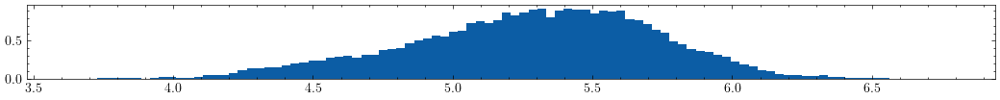

incl@binary@orbit@component 1.0550111200063799


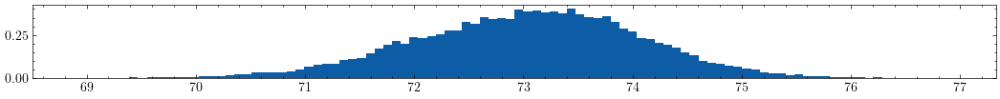

fillout_factor@contact_envelope@envelope@component 0.002628819407403539


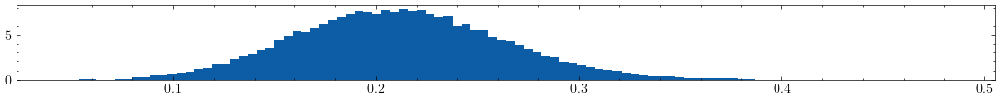

teffratio@binary@orbit@component 4.1522899346824903e-05


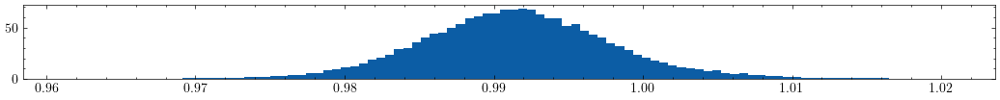

long@primary_hot_spot@primary@spot@feature 27.77512220770467


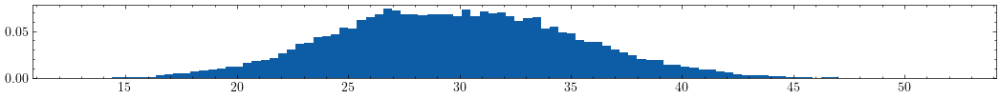

radius@primary_hot_spot@primary@spot@feature 5.948020915503813


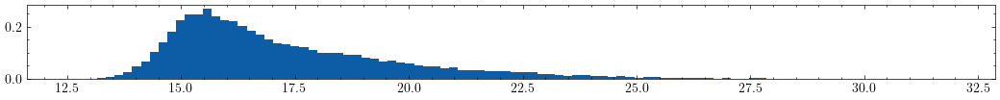

relteff@primary_hot_spot@primary@spot@feature 0.0032812155079653656


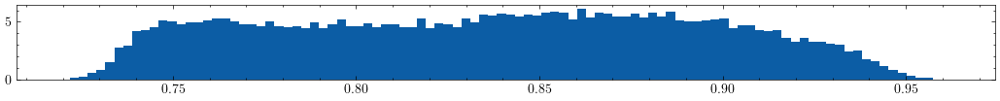

In [7]:
labels = ['q@binary@orbit@component',
            'incl@binary@orbit@component',
            'fillout_factor@contact_envelope@envelope@component',
            'teffratio@binary@orbit@component',
            'long@primary_hot_spot@primary@spot@feature',
            'radius@primary_hot_spot@primary@spot@feature',
            'relteff@primary_hot_spot@primary@spot@feature']

posteriorDist, _ = b.get_distribution_collection(solution='mcmc_solution', lnprob_cutoff=lnprob_cutoff)
samples = posteriorDist.samples
samples = np.delete(samples, [-1, -2], axis=1)

for i, l in enumerate(labels):
    s = samples[:,i]
    print(l, np.var(s))
    plt.figure(figsize=(13, 1))
    plt.hist(s, bins=100, density=True)
    plt.show()

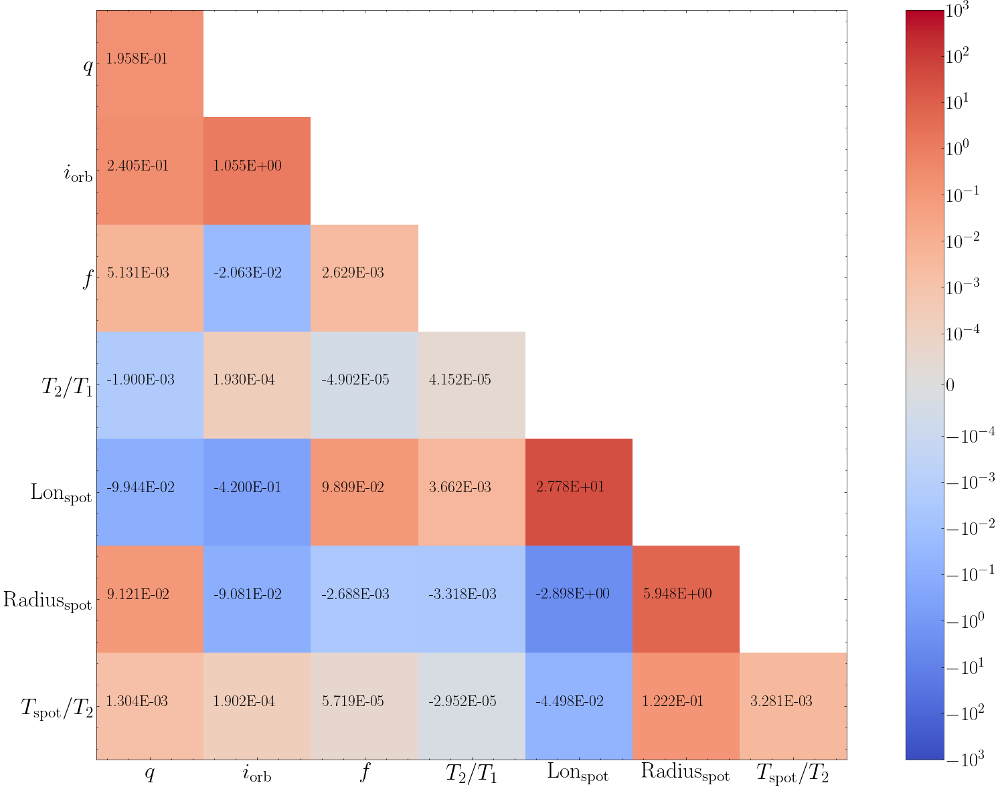

In [8]:
from matplotlib.colors import SymLogNorm

posteriorLatexLabels = ['$q$', 
                        r'$i_{\mathrm{orb}}$', 
                        '$f$', 
	                    '$T_2/T_1$', 
                        # r'$\mathrm{Lat}_{\mathrm{spot}}$',
                        r'$\mathrm{ Lon }_{\mathrm{spot}}$',
                        r'$\mathrm{ Radius }_{\mathrm{spot}}$',
                        r'$T_{\mathrm{spot}} / T_2$',
                        r'$\mathrm{ L_\mathrm{ pb, Iturbide } }$'][:-1]

# covarianceMatrix = posteriorDist.calculate_covariances()
covarianceMatrix = np.cov(samples.T)
for i in range(len(covarianceMatrix)):
	covarianceMatrix[i] = covarianceMatrix[i][::-1]
covarianceMatrix = covarianceMatrix[::-1]
for d in range(len(covarianceMatrix)):
	covarianceMatrix[d:, :d] = np.NaN

# plt.figure(figsize=(24, 12))
plt.figure(figsize=(18, 12))
plt.imshow(covarianceMatrix, norm=SymLogNorm(linthresh=0.0001), cmap='coolwarm', origin='lower')
for row in range(len(covarianceMatrix)):
	for col in range(len(covarianceMatrix[row])):
		covariance = covarianceMatrix[row, col]
		if not np.isnan(covariance):
			plt.text(col + 0.4, row, '%.3E' % covariance, color='black', fontsize=17)

ticks = posteriorLatexLabels[::-1]

plt.xticks(np.arange(len(ticks), dtype=int), ticks, fontsize=24)
plt.yticks(np.arange(len(ticks), dtype=int), ticks, fontsize=24)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=21)
plt.clim(-1000, 1000)
plt.tight_layout()
plt.gca().invert_xaxis()

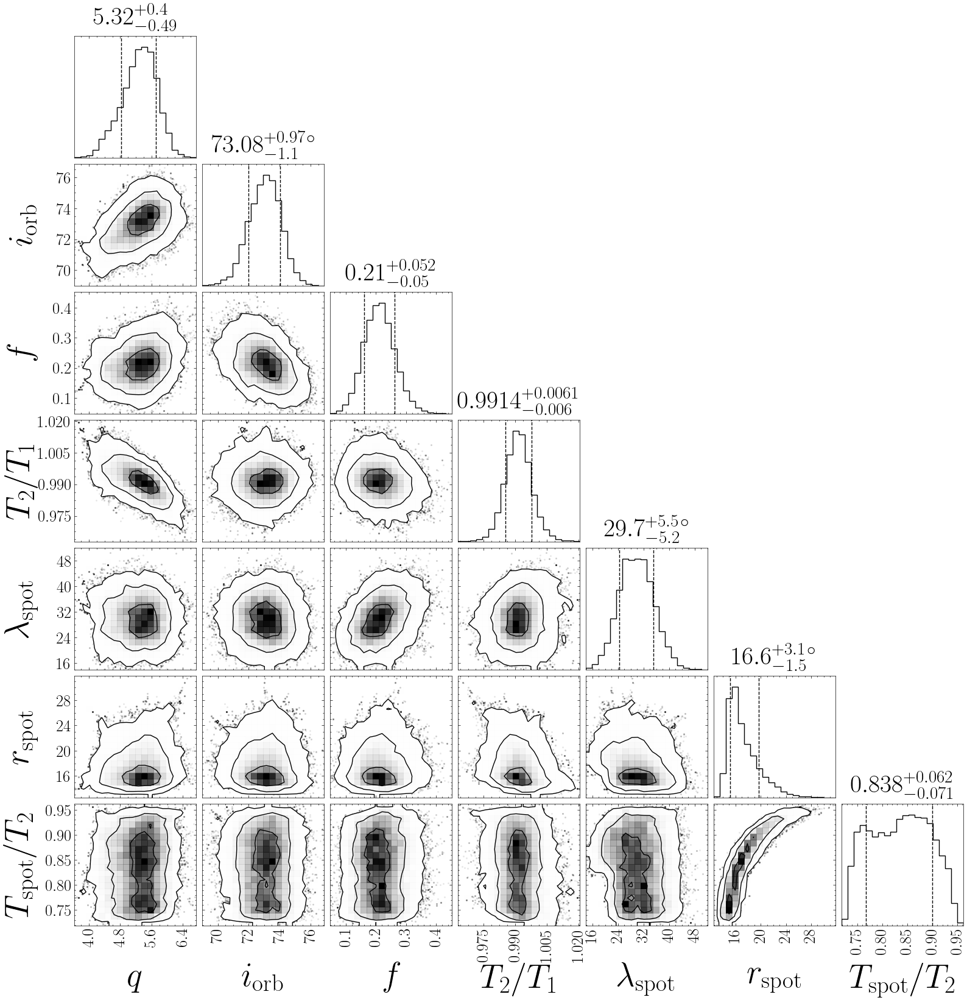

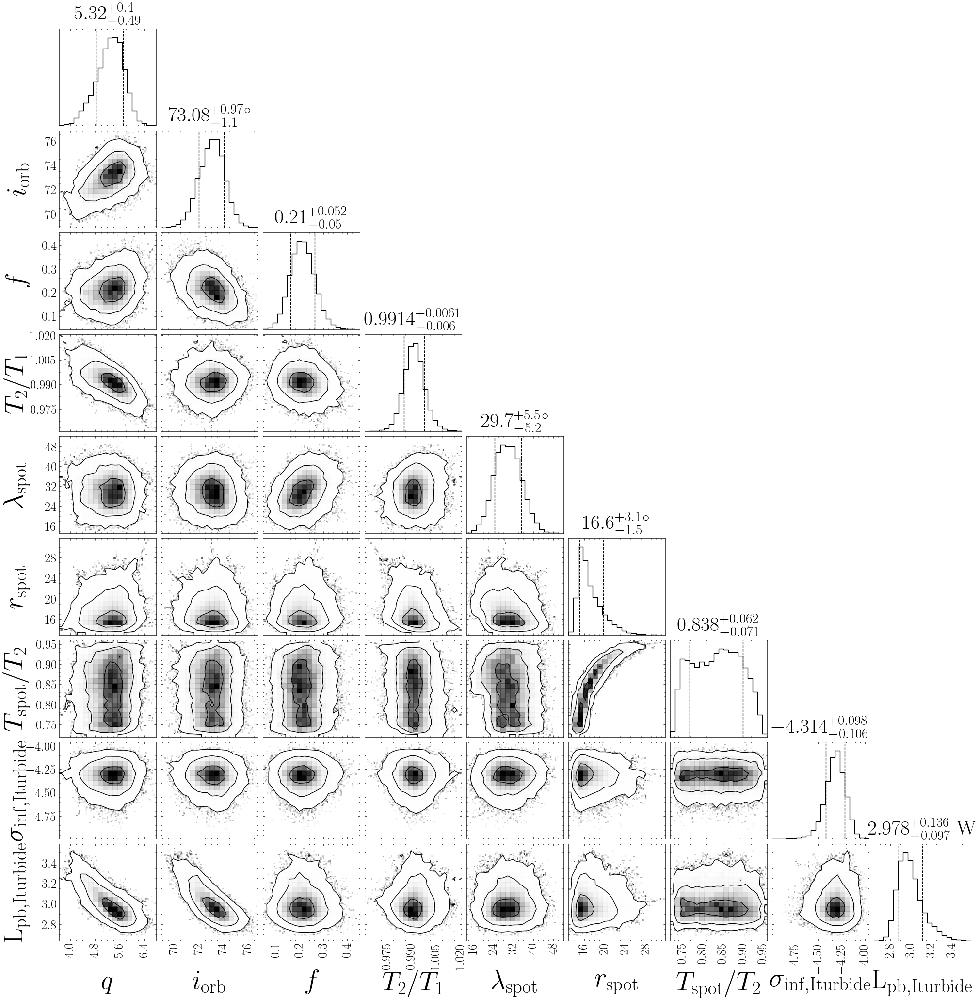

In [9]:
mcmc_utils.plotDistribution(b, distribution='mcmc_solution', parameters=physicalParams, lnprob_cutoff=lnprob_cutoff)
mcmc_utils.plotDistribution(b, distribution='mcmc_solution', lnprob_cutoff=lnprob_cutoff)

In [10]:
gen_utils.exportCompute(b, model='mcmc_sample_model', datasets=[iturbideDataset], subfolder='iturbide', overwrite=True, 
                            lnprob_cutoff=lnprob_cutoff, sample_from='mcmc_solution', sample_num=150, expose_failed=False)

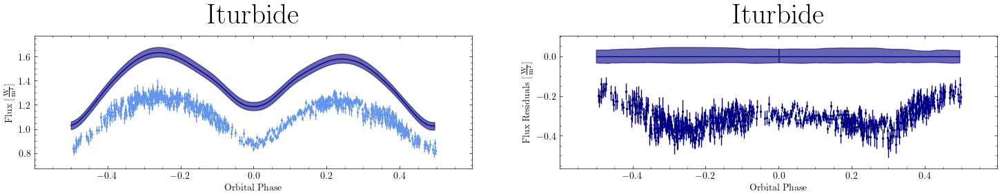

before_mcmc_model - 1184.7144890563536
	 Iturbide (Norm) - 1184.7144890563536
------------------------------------------------
mcmc_sample_model - 110795.32898935463
	 Iturbide (Norm) - 110795.32898935463
------------------------------------------------


In [11]:
sampledModelPath = "./external-compute/iturbide/results/mcmc_sample_model.model"
if os.path.exists(sampledModelPath):
    b.import_model(sampledModelPath, model='mcmc_sample_model', overwrite=True)
    gen_utils.plotModelResidualsFigsize(b, figsize=(18, 2.5), model='mcmc_sample_model', xlabel='Orbital Phase', ylabel='Flux', 
                                            residuals_kwargs={'ylabel': 'Flux Residuals'}, legend=False, title='Iturbide', draw_title=True, 
                                            c=gen_utils.ZTF_PLOT_COLORS | gen_utils.ITURBIDE_PLOT_COLORS)
    gen_utils.printAllModelsChi2(b)

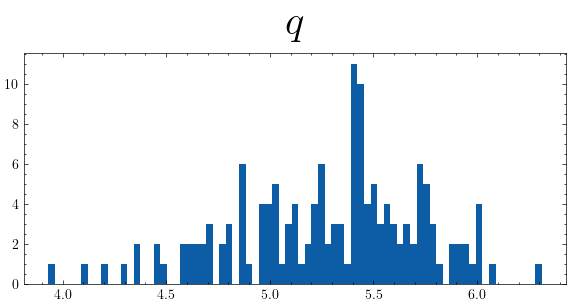

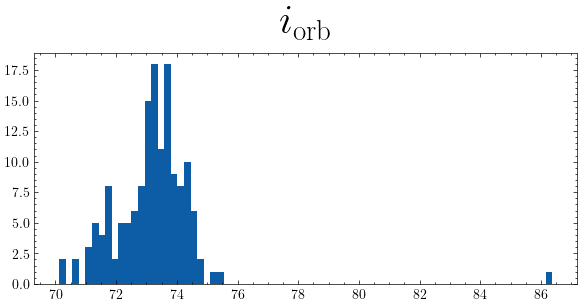

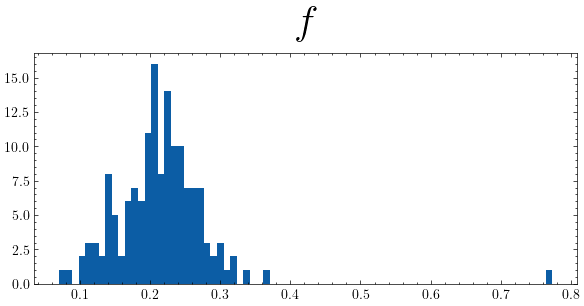

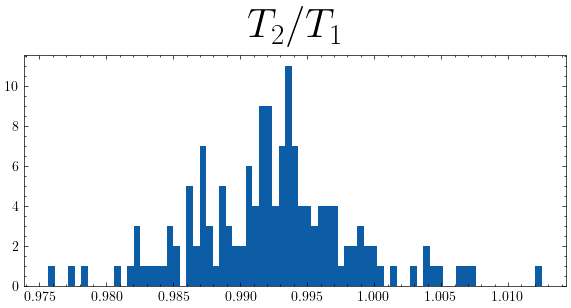

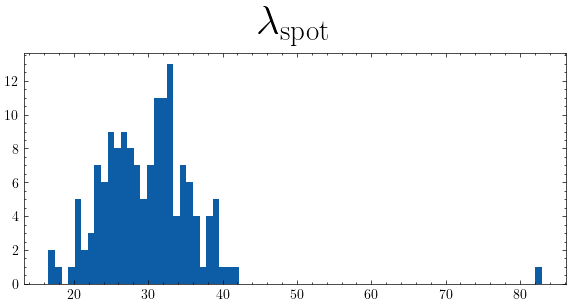

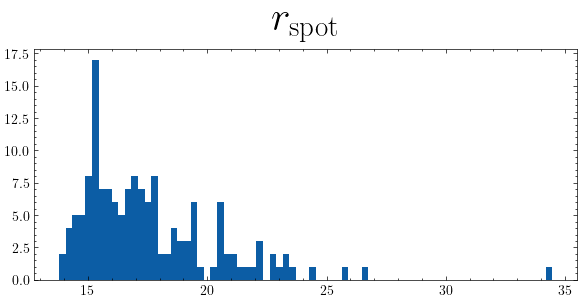

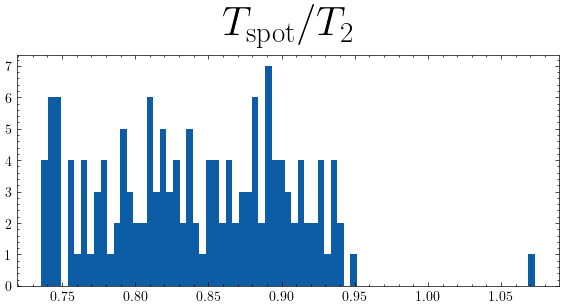

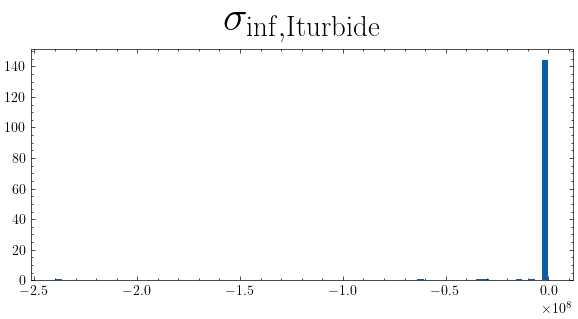

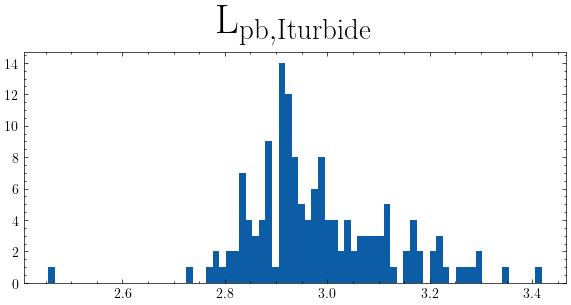

In [12]:
computeSamples = np.array(b['value@mcmc_sample_model@samples']).T
for twig, twigSamples in zip(b.get_value(qualifier='sampled_twigs', model='mcmc_sample_model'), computeSamples):
    plt.figure(figsize=(7, 3))
    plt.hist(twigSamples, bins=75)
    plt.title(mcmc_utils.LATEX_LABELS[twig])
plt.show()

### Mean model

In [13]:
b_cp = b.copy()
res = b_cp.adopt_solution(solution='mcmc_solution', adopt_distributions=False, lnprob_cutoff=lnprob_cutoff)
print("Mean values to adopt:\n=========================================")
for t in res.twigs:
    try:
        if not b_cp.get_parameter(t).constrained_by:
            print(t, b_cp.get_value(t))
    except ValueError:
        pass

Tue, 15 Jul 2025 16:51 BUNDLE       ERROR   Constraint 'requiv@primary@star@constraint' raised the following error while attempting to solve for 'requiv@primary@star@component'.  Consider flipping the constraint or changing the value of one of ['pot@contact_envelope@envelope@component', 'q@binary@orbit@component', 'sma@binary@orbit@component', 'requiv@primary@star@component'] until the constraint succeeds.  Original error: potential < L2/L3 critical value
Tue, 15 Jul 2025 16:51 BUNDLE       ERROR   Constraint 'requiv@secondary@star@constraint' raised the following error while attempting to solve for 'requiv@secondary@star@component'.  Consider flipping the constraint or changing the value of one of ['pot@contact_envelope@envelope@component', 'q@binary@orbit@component', 'sma@binary@orbit@component', 'requiv@secondary@star@component'] until the constraint succeeds.  Original error: potential < L2/L3 critical value


Mean values to adopt:
q@binary@orbit@component 5.317842247572659
incl@binary@orbit@component 73.08190084662805
fillout_factor@contact_envelope@envelope@component 0.21043953770004914
teffratio@binary@orbit@component 0.9914294882104112
long@secondary_cold_spot@secondary@spot@feature 29.703369430236638
radius@secondary_cold_spot@secondary@spot@feature 16.569553925345147
relteff@secondary_cold_spot@secondary@spot@feature 0.8379735009059514
sigmas_lnf@lcIturbide@lc@dataset -4.3140939947842405
pblum@primary@lcIturbide@lc@dataset 2.977661523169976


Tue, 15 Jul 2025 16:51 BUNDLE       ERROR   Constraint 'requiv@primary@star@constraint' raised the following error while attempting to solve for 'requiv@primary@star@component'.  Consider flipping the constraint or changing the value of one of ['pot@contact_envelope@envelope@component', 'q@binary@orbit@component', 'sma@binary@orbit@component', 'requiv@primary@star@component'] until the constraint succeeds.  Original error: potential < L2/L3 critical value
Tue, 15 Jul 2025 16:51 BUNDLE       ERROR   Constraint 'requiv@secondary@star@constraint' raised the following error while attempting to solve for 'requiv@secondary@star@component'.  Consider flipping the constraint or changing the value of one of ['pot@contact_envelope@envelope@component', 'q@binary@orbit@component', 'sma@binary@orbit@component', 'requiv@secondary@star@component'] until the constraint succeeds.  Original error: potential < L2/L3 critical value
100%|██████████| 204/204 [00:10<00:00, 20.09it/s]
Tue, 15 Jul 2025 16:51 B

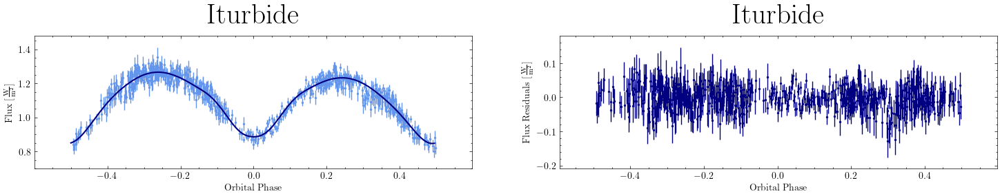

before_mcmc_model - 1184.7144890563536
	 Iturbide (Norm) - 1184.7144890563536
------------------------------------------------
mcmc_sample_model - 110795.32898935463
	 Iturbide (Norm) - 110795.32898935463
------------------------------------------------
mcmc_mean_model - 961.8801683094605
	 Iturbide (Norm) - 961.8801683094605
------------------------------------------------


In [14]:
gen_utils.adopt_solution(b, solution_name='mcmc_solution', model_name='mcmc_mean_model', reset_params=True, avoid_nans=False, 
                            adopt_solution_kwargs={'adopt_distributions': False, 'lnprob_cutoff': lnprob_cutoff}, print_sol=False)

gen_utils.plotModelResidualsFigsize(b, figsize=(18, 2.5), model='mcmc_mean_model', xlabel='Orbital Phase', ylabel='Flux', 
                                        residuals_kwargs={'ylabel': 'Flux Residuals'}, legend=False, title="Iturbide", draw_title=True)
gen_utils.printAllModelsChi2(b)

In [15]:
for m in b.models:
    print(m, b.calculate_lnlikelihood(model=m, dataset=iturbideDataset))

before_mcmc_model 1321.910320020038
mcmc_sample_model -53483.39693012909
mcmc_mean_model 1433.3274803934846


Tue, 15 Jul 2025 16:52 PARAMETERS   WARNING could not find Parameter match for ec=face at time=00.091046, assuming named color
Tue, 15 Jul 2025 16:52 PARAMETERS   WARNING could not find Parameter match for ec=face at time=00.091046, assuming named color


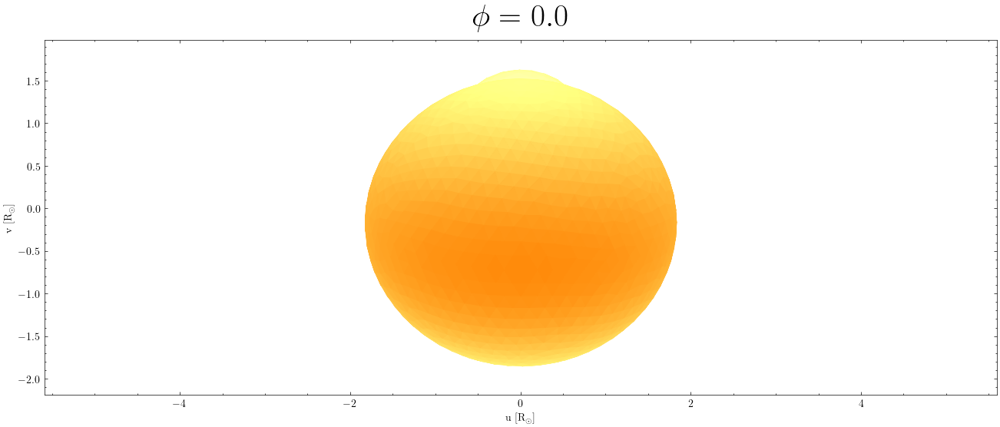

Tue, 15 Jul 2025 16:52 PARAMETERS   WARNING could not find Parameter match for ec=face at time=00.174438, assuming named color
Tue, 15 Jul 2025 16:52 PARAMETERS   WARNING could not find Parameter match for ec=face at time=00.174438, assuming named color


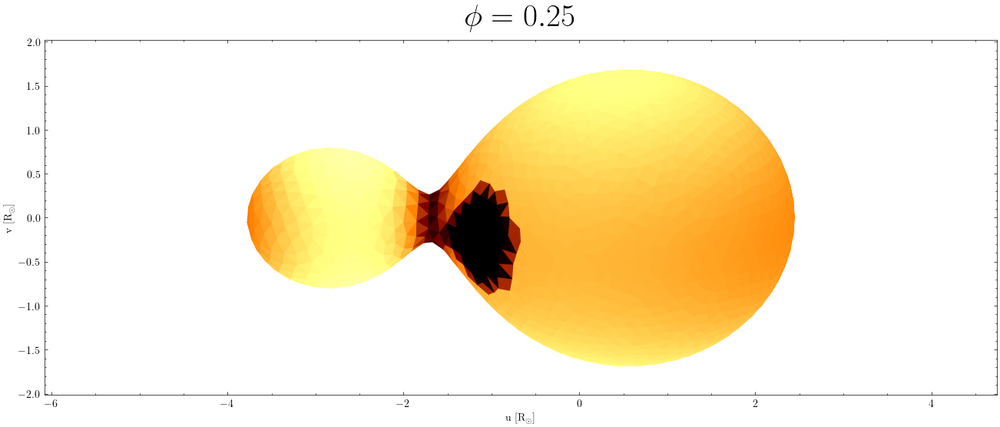

Tue, 15 Jul 2025 16:52 PARAMETERS   WARNING could not find Parameter match for ec=face at time=00.257829, assuming named color
Tue, 15 Jul 2025 16:52 PARAMETERS   WARNING could not find Parameter match for ec=face at time=00.257829, assuming named color


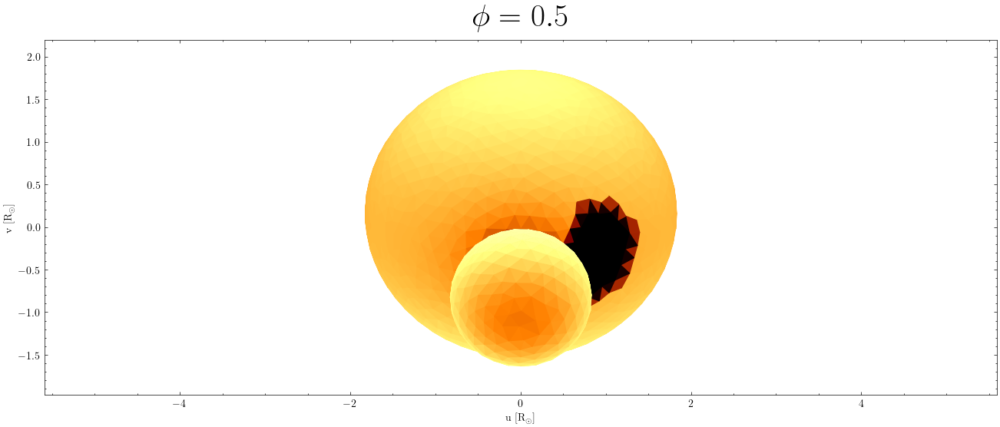

Tue, 15 Jul 2025 16:52 PARAMETERS   WARNING could not find Parameter match for ec=face at time=00.341220, assuming named color
Tue, 15 Jul 2025 16:52 PARAMETERS   WARNING could not find Parameter match for ec=face at time=00.341220, assuming named color


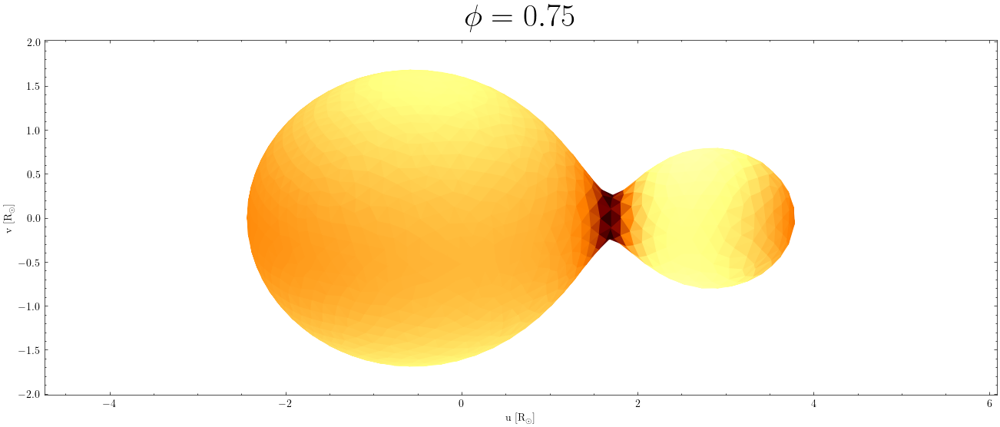

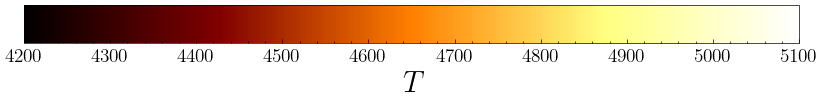

In [16]:
import matplotlib as mpl

teffLimits = (4200, 5100)
for idx, p in enumerate(np.arange(0, 1, 0.25)):
    b.plot(model='mcmc_mean_model', dataset='mesh01', show=True, phase=p, 
           title=fr"$\phi = {p}$", fc='teffs', ec='face', fclim=teffLimits, draw_title=True, fcmap='afmhot', draw_sidebars=False, fig=plt.figure(figsize=(16, 6)))
    
fig, ax = plt.subplots(1, 1, figsize=(10, 0.5))
norm = mpl.colors.Normalize(vmin=teffLimits[0], vmax=teffLimits[1])
cb = mpl.colorbar.ColorbarBase(ax, cmap=plt.cm.afmhot, norm=norm, orientation='horizontal')
cb.set_label(r"$T$", fontsize=22)
ax.tick_params(labelsize=14)